<!-- agrosat-cover -->
<div align="center">

<img alt="Institucion: Tec de Monterrey" src="https://img.shields.io/badge/Institucion-Tec%20de%20Monterrey-002D72">&nbsp;<img alt="Programa: MNA" src="https://img.shields.io/badge/Programa-MNA-0072CE">&nbsp;<img alt="Materia: Proyecto Integrador" src="https://img.shields.io/badge/Materia-Proyecto%20Integrador-F2A900">&nbsp;<img alt="Entregable: Avance 1" src="https://img.shields.io/badge/Entregable-Avance%201-1E40AF">

<img alt="Python: 3.12" src="https://img.shields.io/badge/Python-3.12-3776AB">&nbsp;<img alt="Jupyter: notebook" src="https://img.shields.io/badge/Jupyter-notebook-3776AB">&nbsp;<img alt="PyTorch: 2.4" src="https://img.shields.io/badge/PyTorch-2.4-3776AB">&nbsp;<img alt="Polars: 1.x" src="https://img.shields.io/badge/Polars-1.x-3776AB">

</div>

<h1 align="center">Avance 1 — Analisis Exploratorio de Datos (EDA)</h1>
<p align="center"><strong>AgroSatCopilot</strong> · Cuantificación de superficies de cultivo por satélite</p>

<table align="center"><tr>
<td align="center" width="200"><img src="../../img/IsaacAvila.jpg" width="130" height="130" style="border-radius:50%;object-fit:contain;background:#f0f0f0"><br><strong>Carlos Isaac Ávila Gutiérrez</strong><br><code>A01796035</code><br><sub>ML / Data Scientist</sub></td>
<td align="center" width="200"><img src="../../img/AaronBocanegra.jpg" width="130" height="130" style="border-radius:50%;object-fit:contain;background:#f0f0f0"><br><strong>Carlos Aaron Bocanegra Buitrón</strong><br><code>A01796345</code><br><sub>Full-Stack / Backend</sub></td>
<td align="center" width="200"><img src="../../img/ArthurZizumbo.png" width="130" height="130" style="border-radius:50%;object-fit:contain;background:#f0f0f0"><br><strong>Arthur Jafed Zizumbo Velasco</strong><br><code>A01796363</code><br><sub>MLOps / Platform</sub></td>
</tr></table>

---

<strong>Analisis exploratorio consolidado de PASTIS-R, AlphaEarth y tres regiones italianas: calidad del dato, desbalance de clases, separabilidad de embeddings y decisiones para la ingenieria de caracteristicas.</strong>

<table>
<tr><td><strong>Equipo 17</strong></td><td>&nbsp;&nbsp;• <strong>Carlos Isaac Ávila Gutiérrez</strong> — <code>A01796035</code><br>&nbsp;&nbsp;• <strong>Carlos Aaron Bocanegra Buitrón</strong> — <code>A01796345</code><br>&nbsp;&nbsp;• <strong>Arthur Jafed Zizumbo Velasco</strong> — <code>A01796363</code></td></tr>
<tr><td><strong>Curso</strong></td><td>MNA — Tec de Monterrey · 20-abr → 3-jul-2026</td></tr>
<tr><td><strong>Sponsor académico</strong></td><td>Dr. Gerardo Jesús Camacho González · gjcamacho@tec.mx</td></tr>
<tr><td><strong>Fecha de entrega</strong></td><td>2026-05-13</td></tr>
</table>


## Resumen ejecutivo

Este notebook integra el trabajo de los seis análisis exploratorios que produjimos para el Avance 1 — Sentinel-2 univariado, AlphaEarth Foundations, bivariado/multivariado/temporal, PASTIS-R consolidado, validación cross-region con BreizhCrops y métodos avanzados derivados de la literatura — más un capítulo de conclusiones globales que cruza los hallazgos y los traduce en decisiones concretas para los próximos Avances (Feature Engineering, Baseline y Modelos).

Los notebooks individuales por sección viven en:
- [`02a_eda_sentinel2.ipynb`](02a_eda_sentinel2.ipynb)
- [`02b_eda_alphaearth.ipynb`](02b_eda_alphaearth.ipynb)
- [`02c_eda_bivariado_temporal.ipynb`](02c_eda_bivariado_temporal.ipynb)
- [`02c_eda_pastis.ipynb`](02c_eda_pastis.ipynb)
- [`02d_eda_breizhcrops.ipynb`](02d_eda_breizhcrops.ipynb)
- [`02e_eda_metodos_paper.ipynb`](02e_eda_metodos_paper.ipynb)

Las mismas fichas se sirven en el dashboard Streamlit (`make eda-dashboard`) y en el reporte PDF (`make eda-pdf`). El contenido editorial (narrativas, conclusiones, índices) vive en `ml/report/notebook_content.py` y `ml/report/figure_narratives.py` para garantizar consistencia entre los tres canales.


In [1]:
# Papermill parameters - can be overridden at execution time:
#   poetry run papermill notebook.ipynb out.ipynb \
#     -p figures_dir "paper/figures"
figures_dir = "paper/figures"


In [2]:
from __future__ import annotations

import sys
from pathlib import Path

from IPython.display import Image, Markdown, display

# Bootstrap sys.path so the notebook can import from ml/*
_REPO = Path.cwd().resolve()
for _candidate in (_REPO, *_REPO.parents):
    if (_candidate / "pyproject.toml").is_file():
        _REPO = _candidate
        break
if str(_REPO) not in sys.path:
    sys.path.insert(0, str(_REPO))

FIGURES = _REPO / figures_dir

# Autoreload to pick up changes in ml/*.py without a kernel restart
%load_ext autoreload
%autoreload 2

display(Markdown(f"**Bootstrap completo** · repo = `{_REPO.name}` · figuras = `{FIGURES.relative_to(_REPO)}`"))


**Bootstrap completo** · repo = `agro_sat_copilot` · figuras = `paper\figures`

# Índice

1. [EDA Univariado — Sentinel-2](#sentinel2)
2. [EDA AlphaEarth Foundations (64 dimensiones)](#alphaearth)
3. [EDA Bivariado, Multivariado y Temporal](#bivariatetemporal)
4. [EDA PASTIS-R Consolidado (Avance 1 Equipo 17)](#pastisconsolidado)
5. [EDA BreizhCrops — Validación cross-region (Bretaña, Francia)](#breizhcrops)
6. [EDA Avanzado — Métodos derivados de la literatura](#papermethods)
7. [Conclusiones Globales del Avance 1](#globales)
8. [Atribuciones de licencias](#atribuciones)


<a id="sentinel2"></a>
## 1. EDA Univariado — Sentinel-2

_Análisis univariado de las 10 bandas ópticas de Sentinel-2 sobre PASTIS-R (Francia, con etiquetas reales de agricultores) y tres regiones italianas (Pianura Padana, Toscana y Apulia) muestreadas mediante Google Earth Engine. Buscamos entender qué tan limpios están los datos, cómo se distribuyen los valores y cuánto afecta la nubosidad por región y estación del año._

**Notebook fuente:** `notebooks/eda/02a_eda_sentinel2.ipynb`

**Índice del notebook fuente:**

- 1. Setup y configuración
- 2. Carga de PASTIS-R y muestreo GEE sobre Italia
- 3. Análisis de píxeles inválidos (nubes y sombras)
- 4. Estadísticas descriptivas por banda espectral
- 5. Detección de outliers (IQR + Isolation Forest)
- 6. Cardinalidad de clases (cultivos PASTIS)
- 7. Distribuciones, normalidad y transformaciones recomendadas
- 8. Evolución temporal del NDVI por cultivo
- 9. Estiramiento de contraste (Stretch 2-98) y visualización RGB
- 10. Conclusiones del análisis



**KPIs principales**

| Indicador | Valor | Detalle |
| --- | --- | --- |
| Bandas analizadas | **10** | Sentinel-2 L2A |
| Regiones italianas | **3** | Pianura, Toscana, Apulia |
| Píxeles muestreados | **180k** | + PASTIS-R Francia |
| Mejor estación | **Verano** | 12–21 % de nubes |



### Figuras del análisis (6 figuras)


**Distribuciones de cada banda Sentinel-2**

Cada panel muestra cómo se reparten los valores de reflectancia en una de las 10 bandas del satélite, después de filtrar los píxeles con nubes. Las bandas del visible (azul, verde, rojo) tienen colas largas hacia valores altos por nubes residuales, mientras que las del infrarrojo tienen valores más altos y consistentes — eso es la huella de la vegetación sana. Ninguna banda se comporta como una campana de Gauss; todas están sesgadas hacia valores bajos, lo cual es normal en imágenes satelitales.

> _Cómo se construyó: Muestreo estratificado de píxeles en las 3 regiones italianas (Pianura Padana, Toscana y Apulia) más PASTIS-R Francia como control. Histogramas por banda con bins fijos después de aplicar la máscara SCL del satélite._


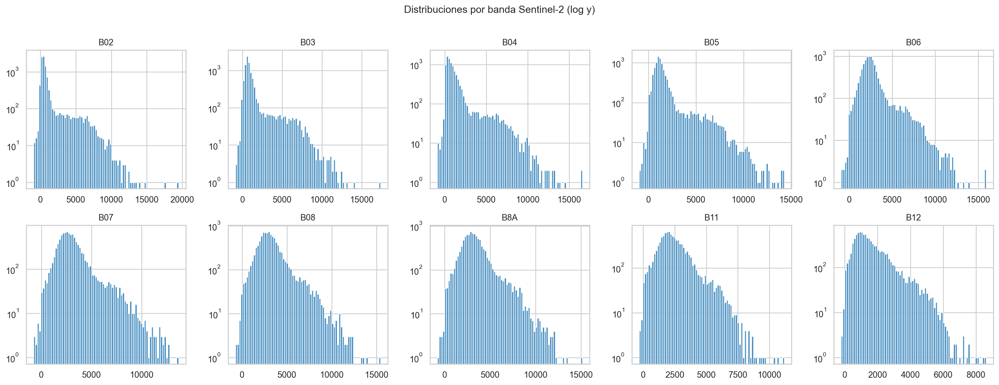

In [3]:
display(Image(str(FIGURES / "us-010/band_distributions.png")))


**Resumen de estadísticas por banda y región**

Esta tabla en forma de mapa de calor compara las cuatro zonas en términos de media, desviación, percentiles y sesgo. Apulia es la zona más homogénea (menor desviación en el infrarrojo), mientras que la Pianura Padana es la más heterogénea por su mosaico parcelario denso. La banda B12 (infrarrojo de onda corta) concentra los valores más extremos por su sensibilidad al estrés hídrico de los cultivos.

> _Cómo se construyó: Agregación por (región, banda) sobre píxeles válidos. Normalización min-max por columna para que todas las métricas sean comparables en el mismo color._


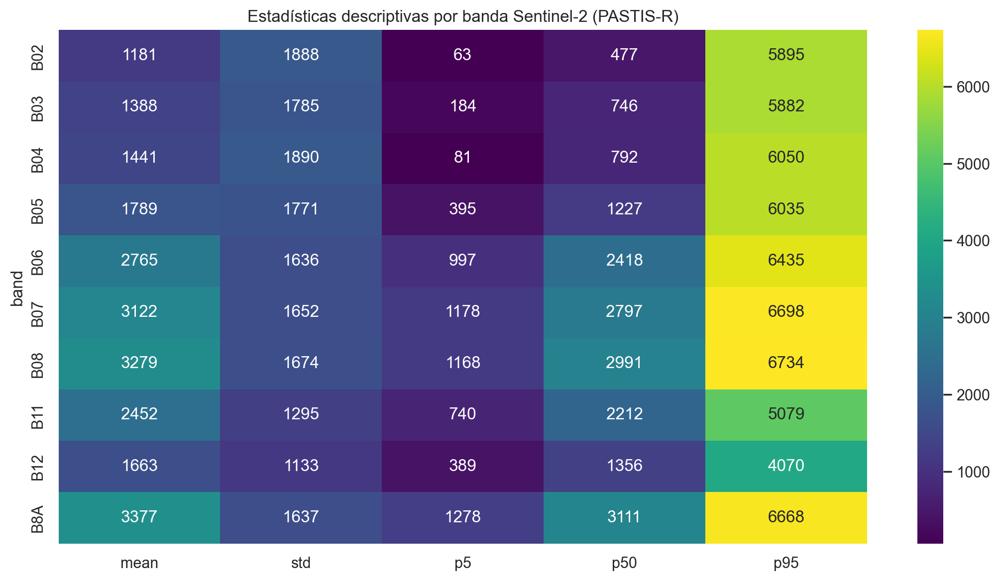

In [4]:
display(Image(str(FIGURES / "us-010/band_stats_heatmap.png")))


**Cuántos píxeles hay por cada cultivo en PASTIS-R**

Trigo blando, maíz y prados dominan el dataset; legumbres, viñedos y frutales son minoritarios. Esta asimetría obliga a hacer muestreo estratificado por clase y región durante los splits de entrenamiento, y a usar una función de pérdida con pesos inversos (o focal loss) durante la fase de segmentación, para que las clases raras no se ‘pierdan’ durante el entrenamiento.

> _Cómo se construyó: Conteo directo de píxeles por clase usando los labels densos del metadata.geojson de PASTIS-R, anotados por agricultores._


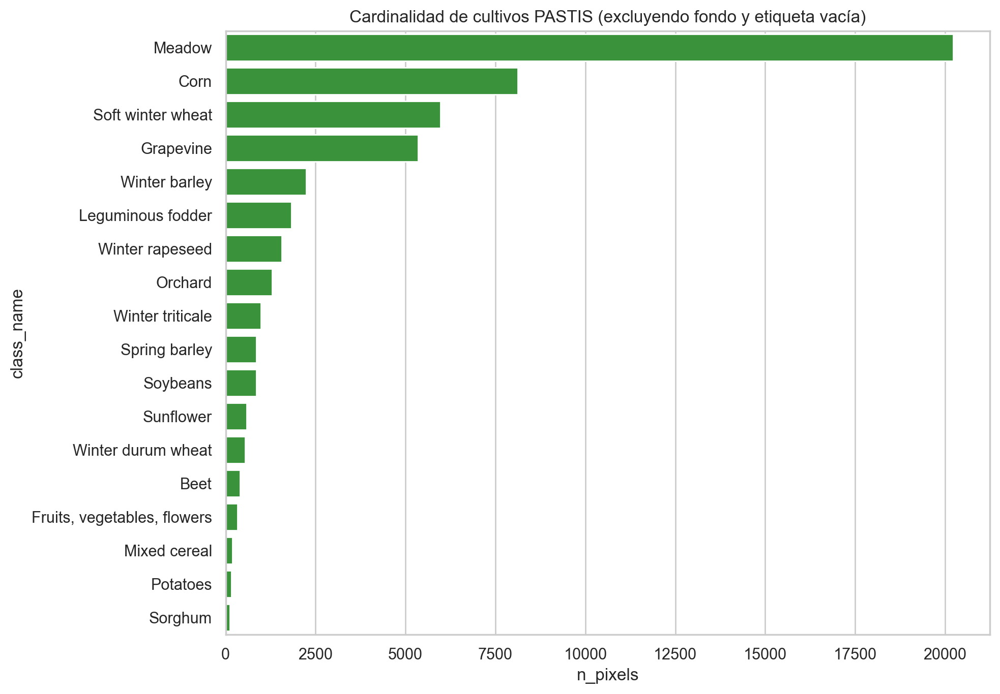

In [5]:
display(Image(str(FIGURES / "us-010/class_cardinality.png")))


**Outliers detectados por dos métodos complementarios**

Aplicamos dos detectores: IQR (mira cada banda por separado) e Isolation Forest (mira las 10 bandas juntas). IQR marca entre 4,6 % y 15,2 % por banda — más en el visible por nubes. Isolation Forest marca un 5 % uniforme. El valor promedio de los puntos atípicos es muy alto (4.700–6.300), lo que confirma que son superficies muy brillantes (nubes que escaparon a la máscara del satélite). Recomendación: aplicar winsorización al percentil 99,5 en lugar de eliminarlos.

> _Cómo se construyó: IQR robusto por banda con los límites Q1−1.5·IQR y Q3+1.5·IQR. Isolation Forest con 100 estimadores sobre las 10 bandas en conjunto._


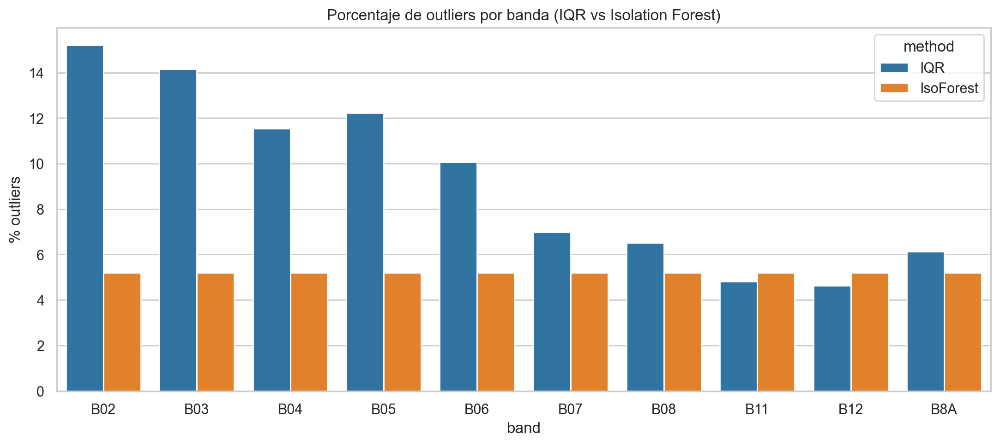

In [6]:
display(Image(str(FIGURES / "us-010/outliers_by_band.png")))


**Cuántos píxeles se pierden por nubes (por región y estación)**

Pianura Padana pierde el 53 % de los píxeles en otoño por nubes; Apulia mantiene el 88 % utilizable en verano. El verano es la mejor estación para todas las zonas; el otoño queda como un gap conocido especialmente en la Pianura. Esta tabla guía la priorización de adquisiciones para el pipeline Dagster que construiremos en el Avance 2.

> _Cómo se construyó: Conteo de píxeles con la bandera SCL válida (clases 4, 5, 6 = vegetación, no-vegetación, agua) sobre el total muestreado por (región, estación del año)._


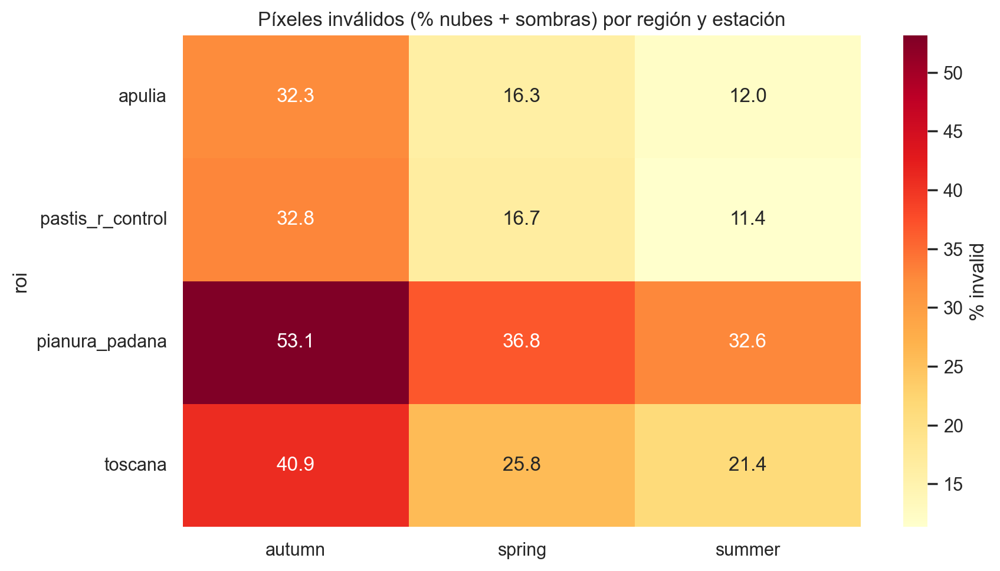

In [7]:
display(Image(str(FIGURES / "us-010/scl_missingness_by_roi_season.png")))


**Visualización RGB de las regiones italianas**

Composiciones RGB en color verdadero (B04 rojo, B03 verde, B02 azul) con un ajuste de contraste entre los percentiles 2 y 98 que descarta los extremos saturados. Permite verificar visualmente que las regiones cubren mosaicos agrícolas reales y no superficies degeneradas. Funciona como sanity check antes de entrar al feature engineering.

> _Cómo se construyó: Reflectancia escalada por banda al rango [percentil 2, percentil 98] y luego normalizada a [0, 1] para visualización._


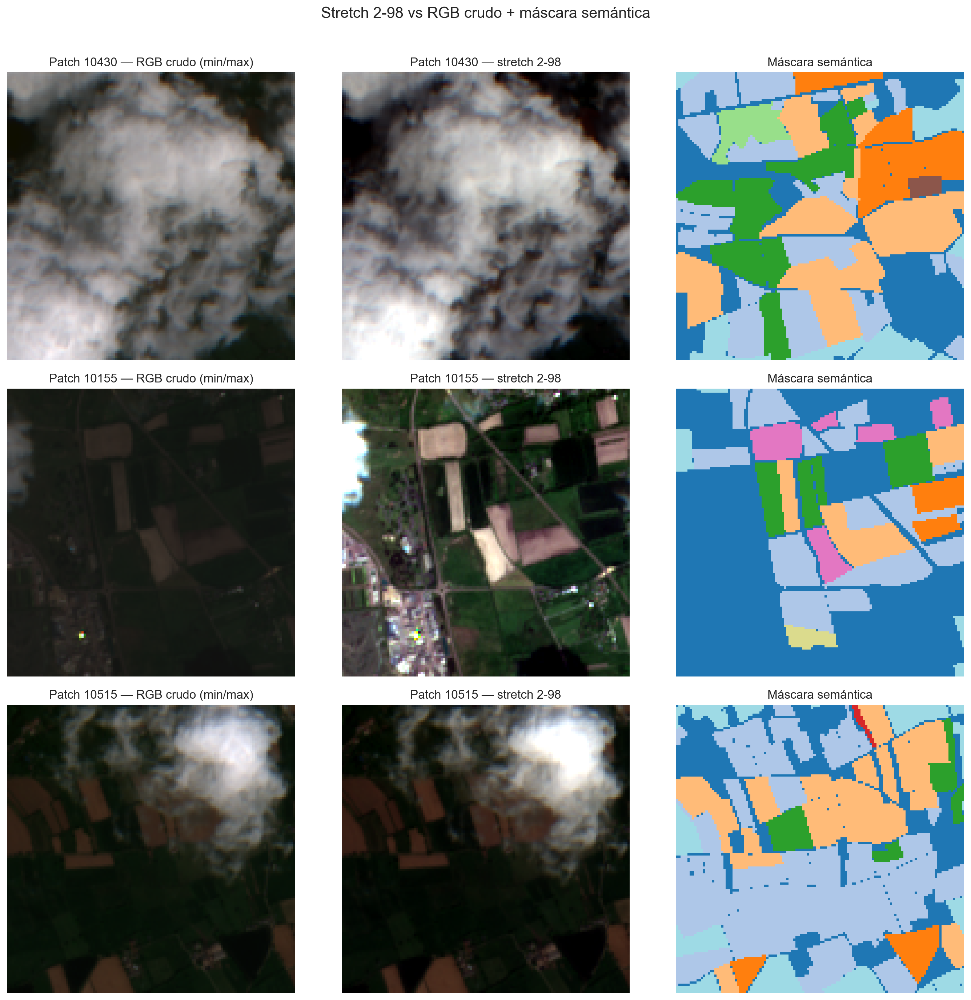

In [8]:
display(Image(str(FIGURES / "us-010/stretch_2_98_grid.png")))


### Conclusiones e interpretación (5 hallazgos)


**Las 10 bandas aportan información — ninguna se descarta**

Las bandas del visible (azul, verde, rojo) muestran valores promedio bajos (1.200–1.440) mientras que las del infrarrojo cercano y borde rojo (B07, B08, B8A) llegan a ser 2 a 3 veces más altas (3.100–3.400). La vegetación sana refleja mucho infrarrojo y poco rojo: ese contraste es la huella que permite separar cultivos. Conclusión práctica: mantener las 10 bandas como features candidatas para el baseline.


**Los datos vienen sucios y hay que limpiarlos antes de modelar**

El 0,47 % de los píxeles tiene valor -10.000 (marcador de ‘sin dato’ del satélite) y se filtra sin problema. Tras filtrar, persisten valores levemente negativos (entre -300 y -994) que son artefactos de la corrección atmosférica sobre agua y sombras — válidos, no errores. Ninguna banda sigue una distribución normal: todas están sesgadas hacia valores bajos, comportamiento típico de sensores satelitales.


**La nubosidad domina y varía mucho por zona y estación**

Pianura Padana pierde el 53 % de los píxeles en otoño por nubes (33 % en verano). Toscana central queda en 41 % otoño y 21 % verano. Apulia es la zona más limpia todo el año (12 % en verano, 32 % en otoño). El verano es la mejor estación para las tres zonas. Esto guía cuándo priorizar adquisiciones para el pipeline del Avance 2.


**Los outliers son nubes residuales, no errores de medición**

El método IQR univariado marca entre 4,6 % y 15,2 % de outliers por banda (más en visible por nubes). Isolation Forest multivariado marca un 5 % uniforme. El valor promedio de los puntos atípicos es 4.700–6.300, confirmando que son superficies muy brillantes (nubes que escaparon a la máscara del satélite). Recomendación: aplicar winsorización al percentil 99,5 en lugar de eliminarlos.


**Lo que sigue para el Avance 2**

Replicar la máscara de calidad antes de cualquier feature engineering. Aplicar transformación logarítmica o Yeo-Johnson para corregir el sesgo. Priorizar verano para ventanas de adquisición y aceptar pérdidas mayores en otoño en Pianura Padana. Mantener las 10 bandas como features candidatas — no hay redundancia a este nivel univariado.


<a id="alphaearth"></a>
## 2. EDA AlphaEarth Foundations (64 dimensiones)

_AlphaEarth es un modelo de Google que comprime cada píxel satelital de 10 m de la Tierra en un vector de 64 números. Aquí evaluamos si esos 64 números sirven para distinguir tipos de cultivos en dos países muy diferentes: Italia (3 regiones piloto con etiquetas Dynamic World, 6.000 píxeles) y Francia (10 patches PASTIS-R con 13 cultivos reales, 5.000 píxeles)._

**Notebook fuente:** `notebooks/eda/02b_eda_alphaearth.ipynb`

**Índice del notebook fuente:**

- Sección 1 — Italia × Dynamic World (separabilidad de clases)
- Sección 2 — Francia × PASTIS-R (separabilidad agronómica)
- Sección 3 — Comparativa cross-region (estabilidad y consistencia)
- Conclusiones — qué aprendimos de los embeddings



**KPIs principales**

| Indicador | Valor | Detalle |
| --- | --- | --- |
| Dimensiones | **64** | Embeddings por píxel |
| OOB Italia | **0,888** | RF sobre 8 clases |
| OOB Francia | **0,831** | RF sobre 13 cultivos |
| Estabilidad entre años | **0,97** | Similitud coseno mediana |



### Figuras del análisis (10 figuras)


**AlphaEarth aporta más información que el NDVI clásico**

Panel comparativo de tres vistas: RGB Sentinel-2 real, NDVI escalar y un ‘pseudo-RGB’ construido con las 3 dimensiones AlphaEarth más informativas. El pseudo-RGB resalta la variación estructural (parcelas, caminos) que el NDVI aplana en un solo número. Eso justifica usar AlphaEarth como pool de features principal en el baseline del Avance 3.

> _Cómo se construyó: Selección de las 3 dimensiones con mayor importancia Random Forest sobre Italia. Mapeo de cada dimensión a un canal R/G/B con normalización min-max._


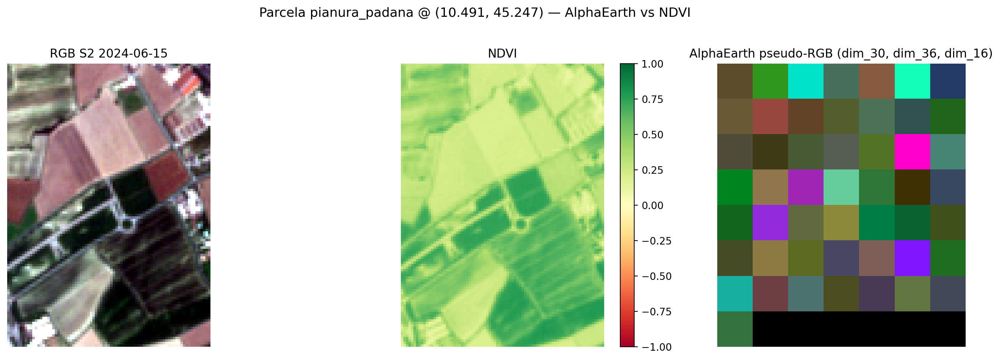

In [9]:
display(Image(str(FIGURES / "us-011/sec1_alphaearth_vs_ndvi.png")))


**Correlación entre las 64 dimensiones AlphaEarth (Italia)**

Mapa de calor que muestra cuánto se parecen entre sí las 64 dimensiones AlphaEarth sobre los 6.000 píxeles italianos etiquetados con Dynamic World. Hay varios pares con |r| > 0,7 que indican redundancia. Aplicar PCA antes de XGBoost reduce el ruido sin perder capacidad discriminativa.

> _Cómo se construyó: Correlación Pearson sobre los embeddings AlphaEarth v2.1 estándar; matriz simétrica con diagonal = 1._


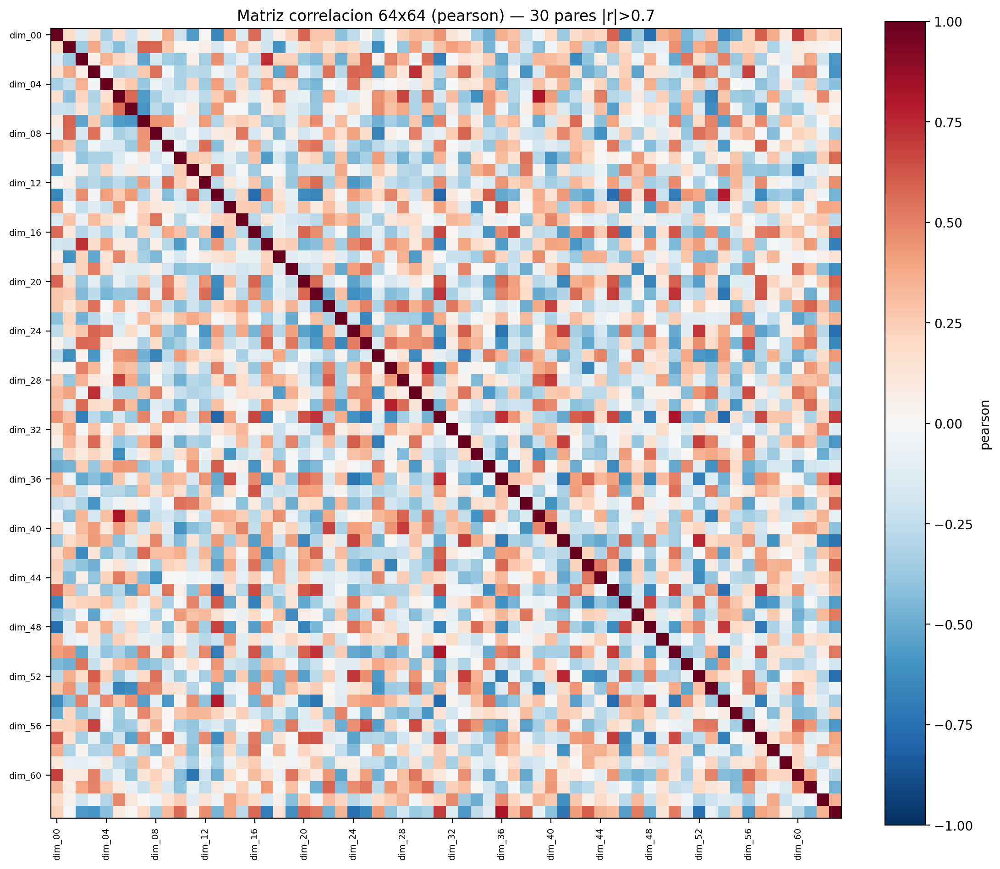

In [10]:
display(Image(str(FIGURES / "us-011/sec1_corr_italia_dw.png")))


**¿Las dimensiones AlphaEarth son aproximadamente normales? (Italia)**

Los QQ-plots comparan cada dimensión con la normal estándar. La mayoría se desvía en las colas (colas pesadas), pero el centro es aproximadamente normal. Eso justifica usar PCA directamente sobre los embeddings, sin necesidad de transformación logarítmica previa.

> _Cómo se construyó: QQ-plot de cada dim_XX contra distribución normal estándar. Submuestra de 1.000 píxeles para mantener los gráficos legibles._


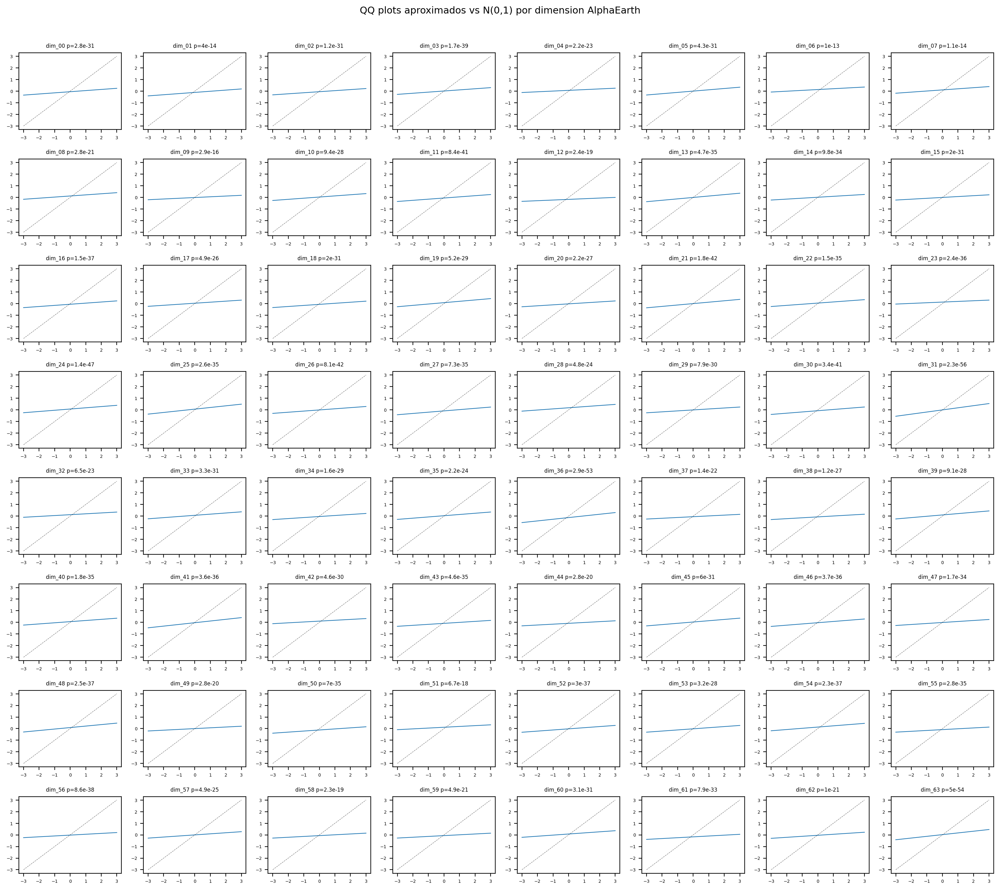

In [11]:
display(Image(str(FIGURES / "us-011/sec1_qq_italia_dw.png")))


**Proyección t-SNE 2D coloreada por clase Dynamic World (Italia)**

Proyección 2D que comprime las 64 dimensiones en un plano. Se ven clusters claros: agricultura separada de zonas construidas, agua y bosque. Un Random Forest simple sobre estos 64 números logra OOB 0,888 sobre 8 clases — los embeddings ya capturan la información necesaria sin feature engineering manual.

> _Cómo se construyó: t-SNE con perplexity = 30 sobre una submuestra de 5.000 píxeles. Coloreado por la clase Dynamic World (8 categorías dominantes)._


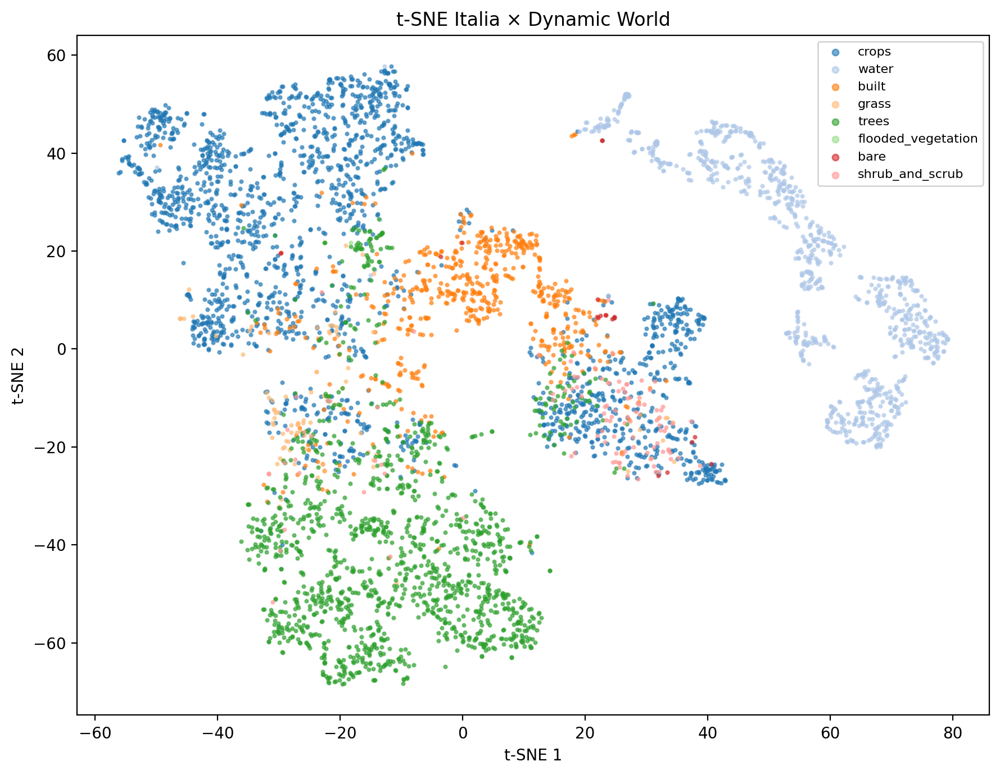

In [12]:
display(Image(str(FIGURES / "us-011/sec1_tsne_italia_dw.png")))


**Proyección UMAP 2D coloreada por clase Dynamic World (Italia)**

Variante de t-SNE con UMAP. UMAP preserva mejor la estructura global y permite ver las relaciones entre clusters. Sirve como sanity check de robustez: si UMAP y t-SNE coinciden, la estructura es real (no es artefacto de un solo método).

> _Cómo se construyó: UMAP con n_neighbors = 15 y min_dist = 0,1 sobre la misma submuestra que t-SNE._


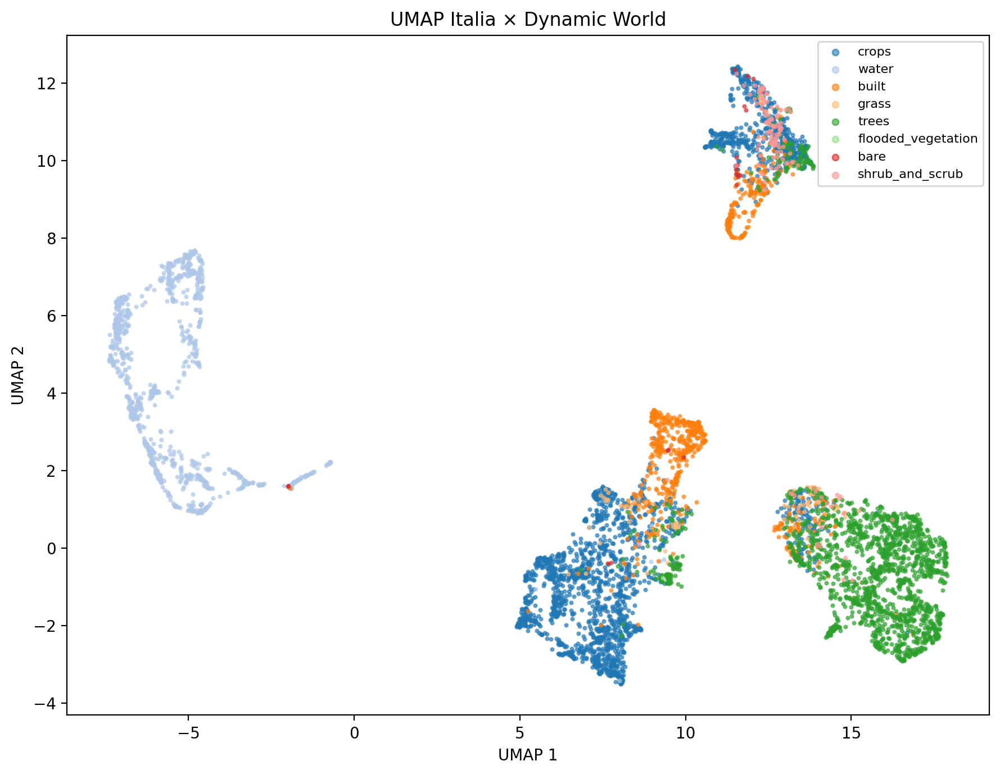

In [13]:
display(Image(str(FIGURES / "us-011/sec1_umap_italia_dw.png")))


**Correlación entre las 64 dimensiones AlphaEarth (Francia)**

Misma matriz pero sobre los 5.000 píxeles franceses con etiquetas reales de agricultores. Comparada con Italia, la estructura de correlaciones cambia: confirma que AlphaEarth aprendió representaciones diferentes según la región.

> _Cómo se construyó: Mismo procedimiento que sec1_corr_italia_dw pero sobre los 10 patches PASTIS-R con labels densos._


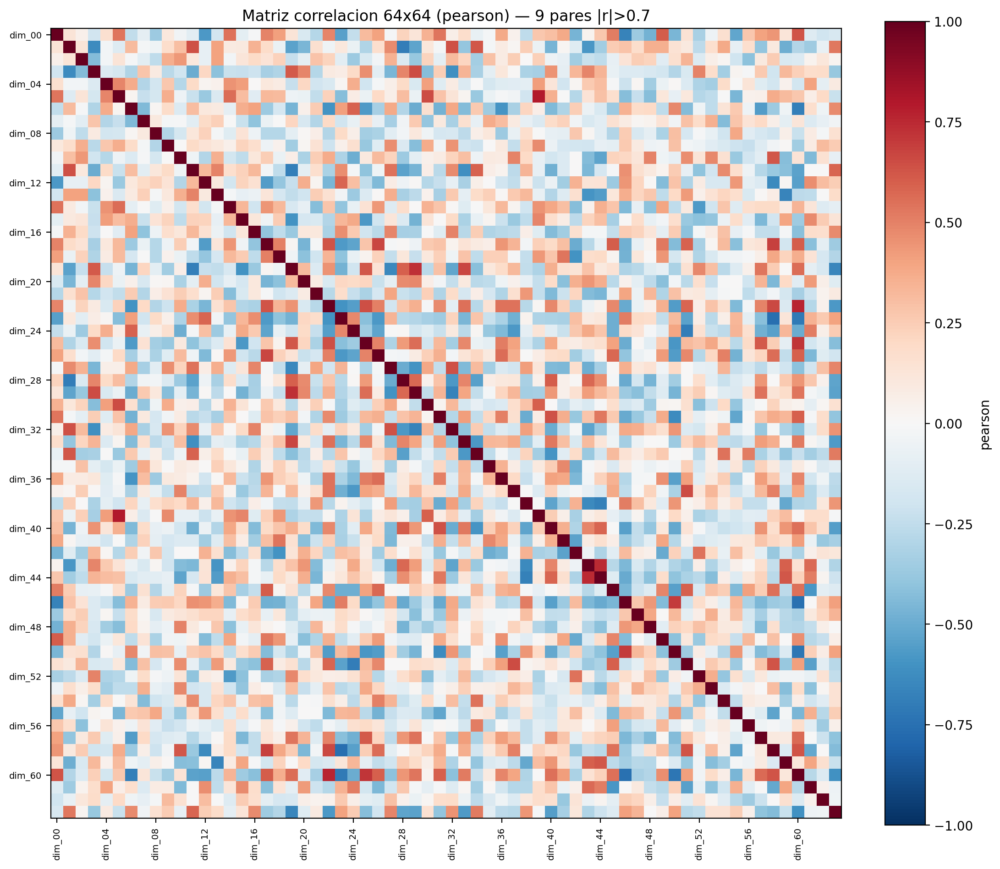

In [14]:
display(Image(str(FIGURES / "us-011/sec2_corr_francia_pastis.png")))


**Proyección t-SNE 2D coloreada por cultivo PASTIS-R (Francia)**

Los 13 cultivos etiquetados forman clusters separables. Random Forest alcanza OOB 0,831 — menor que en Italia (0,888) porque PASTIS tiene 13 clases agronómicas finas frente a 8 categorías de Dynamic World. La separación es visible: cereales de invierno en una zona, cultivos de verano en otra, prados en una tercera.

> _Cómo se construyó: t-SNE con perplexity = 30 sobre 5.000 píxeles franceses estratificados._


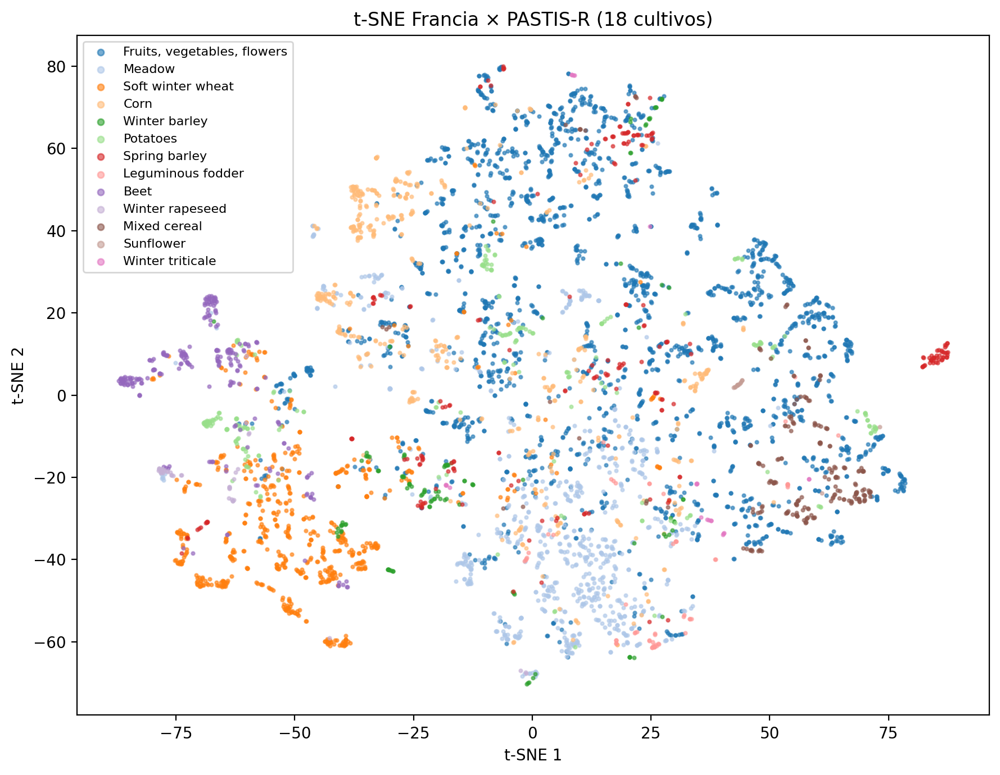

In [15]:
display(Image(str(FIGURES / "us-011/sec2_tsne_francia_pastis.png")))


**t-SNE coloreado por familia fenológica (Francia)**

Variante del t-SNE anterior que agrupa los cultivos por familia fenológica: cereales de invierno, cereales de verano, oleaginosas y prados. La separación mejora respecto a las 13 clases finas, lo cual sugiere que un baseline jerárquico (predecir primero la familia y luego el cultivo) podría ser más efectivo.

> _Cómo se construyó: Se aplica el mapping PASTIS_R_GROUPINGS antes del coloreado. Misma proyección t-SNE que sec2_tsne_francia_pastis._


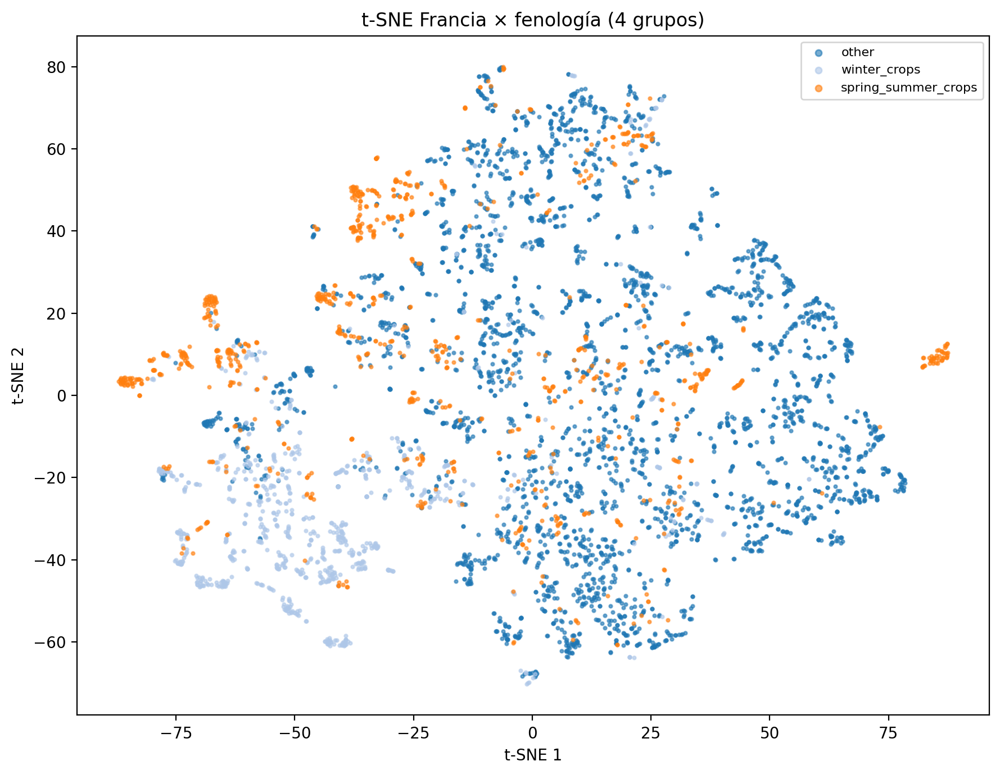

In [16]:
display(Image(str(FIGURES / "us-011/sec2_tsne_francia_phenology.png")))


**Proyección UMAP 2D coloreada por cultivo PASTIS-R (Francia)**

UMAP sobre los mismos 5.000 píxeles franceses. Los cultivos PASTIS forman clusters más compactos que en t-SNE; UMAP captura mejor la estructura agronómica de transición entre familias (cereales → oleaginosas → prados).

> _Cómo se construyó: UMAP con n_neighbors = 15 y min_dist = 0,1 sobre 5.000 píxeles franceses._


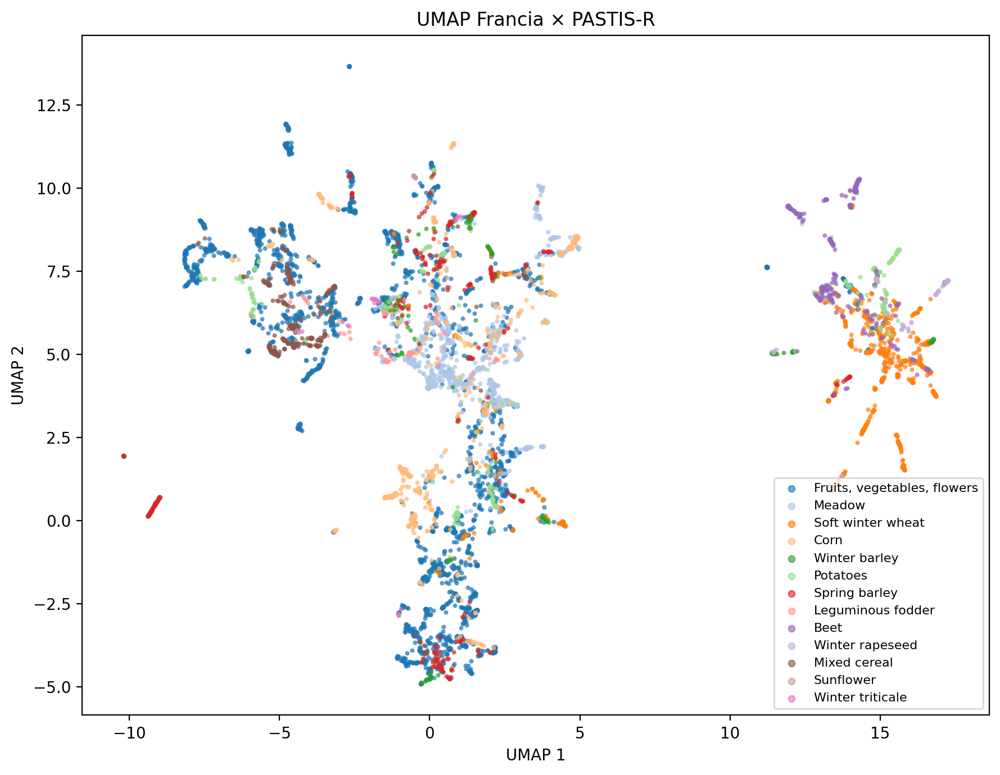

In [17]:
display(Image(str(FIGURES / "us-011/sec2_umap_francia_pastis.png")))


**¿Las dimensiones útiles en Italia y Francia coinciden?**

Mapa de calor que muestra cuánta similitud hay entre las top-10 dimensiones más útiles en cada país. Solo dim_40 coincide en el top de ambos; el resto del top-10 cambia totalmente. Conclusión: AlphaEarth se especializa por región. Entrenar un solo clasificador global rinde menos que entrenar uno por región.

> _Cómo se construyó: Importancia de features con Random Forest en cada región. Intersección de top-K = 10. Visualización como matriz de overlap._


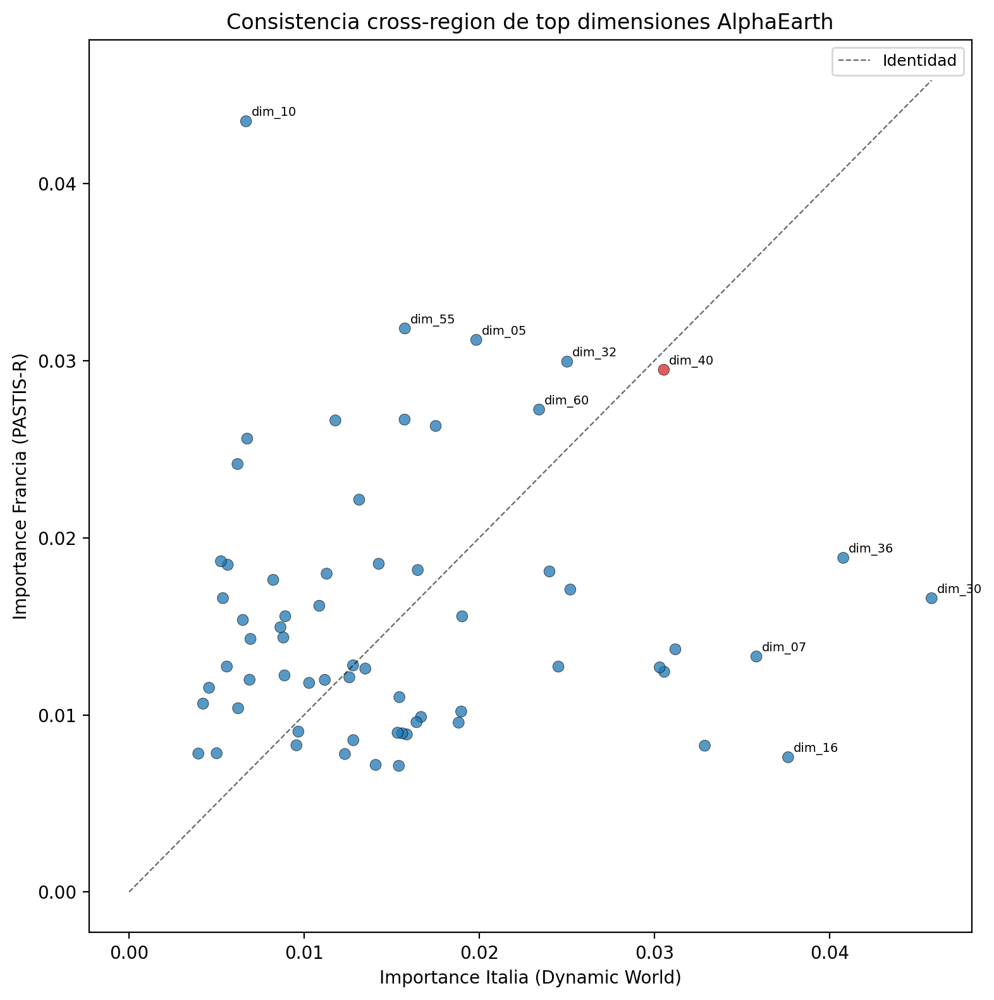

In [18]:
display(Image(str(FIGURES / "us-011/sec3_cross_region_consistency.png")))


### Conclusiones e interpretación (6 hallazgos)


**Los embeddings separan cultivos sin feature engineering manual**

En las proyecciones t-SNE y UMAP se ven clusters claros: agricultura separada de zonas construidas, agua y bosque. No fue necesario calcular NDVI, EVI ni NDWI — los 64 números ya capturan esa información. Un Random Forest simple sobre los embeddings logra OOB score 0,888 en Italia (8 clases) y 0,831 en Francia (13 cultivos PASTIS-R).


**AlphaEarth carga más señal que el NDVI clásico**

El panel comparativo muestra el RGB real de Sentinel-2 al lado del ‘pseudo-RGB’ construido con las 3 dimensiones AlphaEarth más informativas. El pseudo-RGB resalta variación estructural (parcelas, caminos) que un solo índice escalar como NDVI aplana. Justifica usar AlphaEarth como pool de features principal en el baseline.


**Los embeddings se especializan por región**

De las 10 dimensiones más útiles para clasificar, solo dim_40 coincide entre Italia y Francia. Italia se apoya en dim_30, dim_36, dim_16, dim_07 y dim_63; Francia en dim_10, dim_55, dim_05, dim_32 y dim_60. AlphaEarth aprendió representaciones que dependen del contexto regional. Consecuencia: entrenar un clasificador por región rinde más que entrenar uno solo global.


**Estabilidad temporal alta entre años consecutivos**

La similitud coseno entre embeddings de las mismas coordenadas en años consecutivos es muy alta: 2022 vs 2023 mediana 0,967 — 2023 vs 2024 mediana 0,975 — 2024 vs 2025 mediana 0,976. Para parcelas con uso del suelo constante podemos entrenar con un solo año y predecir en años cercanos sin re-entrenar el modelo.


**Existe redundancia entre dimensiones**

La matriz de correlación 64×64 detecta varios pares con |r| > 0,7. Aplicar PCA antes de XGBoost reduce el ruido sin perder capacidad discriminativa. No es bloqueante, pero ayuda al baseline a converger más rápido.


**Lo que sigue para el Avance 2**

Probar el baseline XGBoost por región en lugar de uno global. Aplicar PCA o seleccionar las top-10 dimensiones por región antes de la fusión multisensor. Mantener las 64 dimensiones como pool principal, complementadas con NDVI, NDMI y EVI explícitos para interpretabilidad.


<a id="bivariatetemporal"></a>
## 3. EDA Bivariado, Multivariado y Temporal

_Aquí buscamos relaciones entre variables: correlaciones entre las bandas Sentinel-2 y los índices espectrales, redundancia (multicolinealidad VIF), fenología (mes del pico de vegetación), autocorrelación temporal y agrupamiento DTW sobre series temporales de PASTIS-R._

**Notebook fuente:** `notebooks/eda/02c_eda_bivariado_temporal.ipynb`

**Índice del notebook fuente:**

- 1. Setup y carga de timesteps PASTIS-R
- 2. Máscara de calidad: filtrado de timesteps con bandas fuera de rango
- 3. Correlaciones Pearson y Spearman (bandas–bandas, bandas–índices, índices–índices)
- 4. VIF para detección de multicolinealidad
- 5. Pairplot Top-5 features por clase
- 6. Pico NDVI por clase (mes y valor)
- 7. Autocorrelación (ACF) por clase
- 8. Agrupamiento DTW de series temporales
- 9. Cruces con ERA5 (precipitación y NDVI)
- Conclusiones



**KPIs principales**

| Indicador | Valor | Detalle |
| --- | --- | --- |
| Timesteps filtrados | **6,3 %** | 545 de 8.600 |
| Pares |r| > 0,85 | **19 + 6** | Banda–banda + índice–índice |
| VIF mínimo | **11,3** | EVI (umbral 10) |
| Pureza DTW k = 6 | **0,380** | vs 0,06 aleatorio |



### Figuras del análisis (12 figuras)


**Correlación Pearson entre bandas Sentinel-2**

Mapa de calor de correlaciones entre las 10 bandas: 19 pares únicos banda–banda superan |r| > 0,85. El cuarteto {B07, B8A, B02, B03} forma un bloque casi perfecto (B07 vs B8A = 0,997). Aplicar PCA al subconjunto de bandas elimina la redundancia sin perder información antes del baseline.

> _Cómo se construyó: Pearson r sobre píxeles válidos tras la máscara de calidad (rango físico [0; 1,5] tras escalar a reflectancia)._


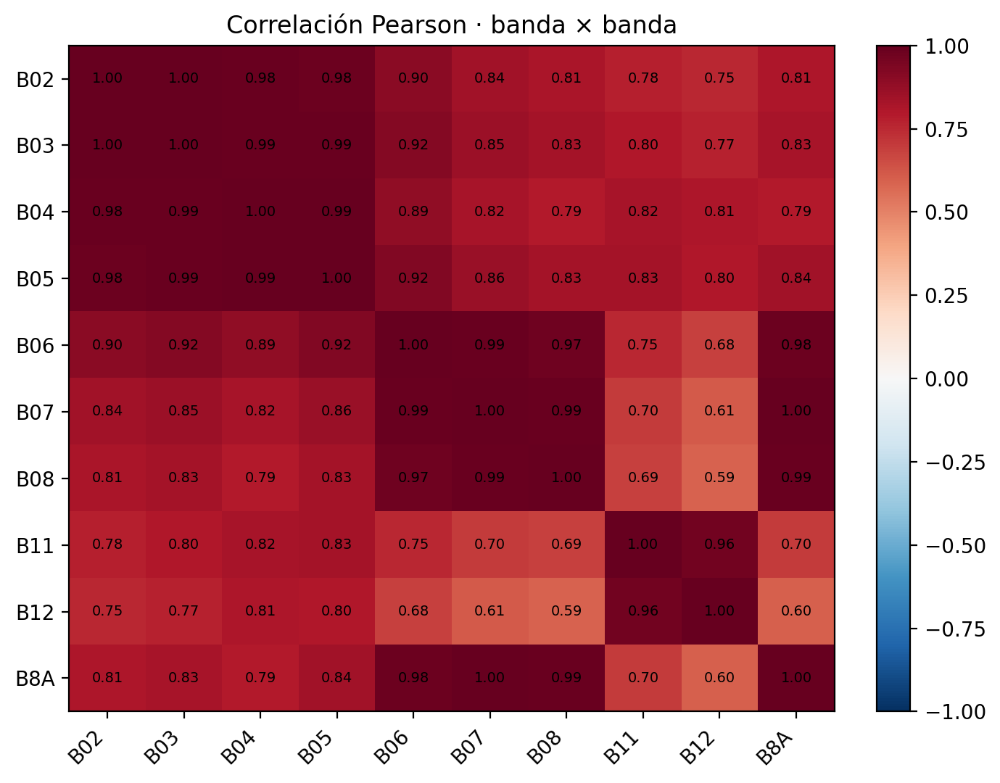

In [19]:
display(Image(str(FIGURES / "us-012/sec3_corr_pearson_bands_bands.png")))


**Correlación Pearson entre bandas e índices espectrales**

Hay un techo en r ≈ 0,80 (B04 vs NDWI). La no-linealidad de la fórmula (a−b)/(a+b) que usan los índices impide que crucen correlaciones perfectas con las bandas crudas. Esto justifica mantener bandas e índices como fuentes complementarias en el feature engineering.

> _Cómo se construyó: Mismo procedimiento Pearson, cruzando las 10 bandas con los 17 índices candidatos._


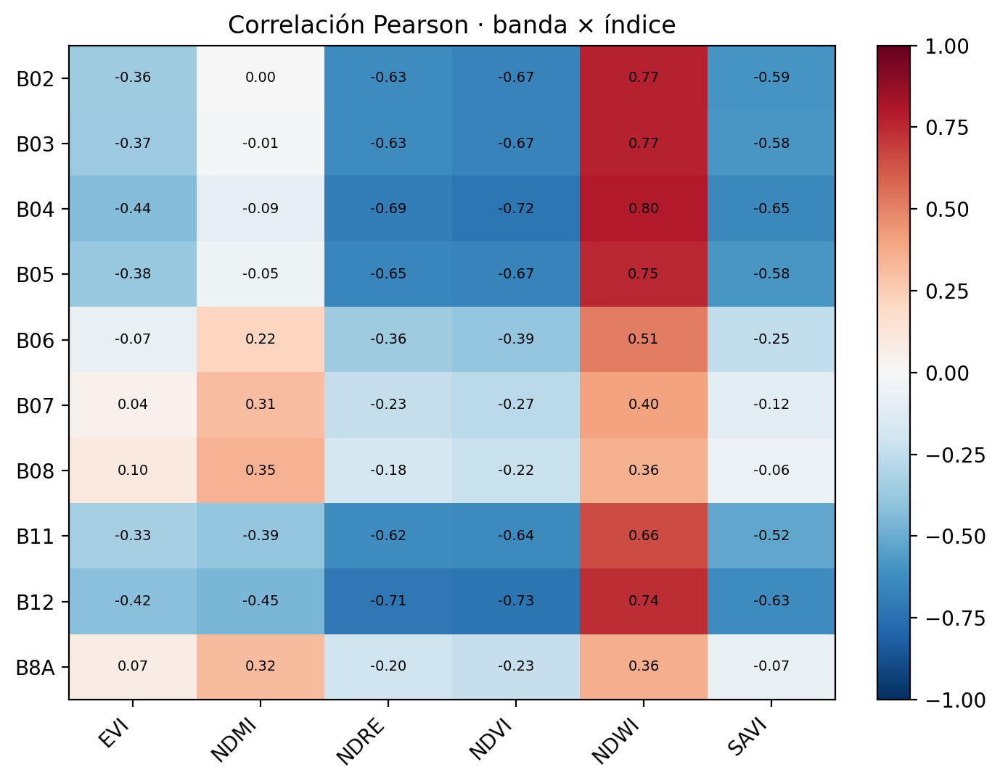

In [20]:
display(Image(str(FIGURES / "us-012/sec3_corr_pearson_bands_indices.png")))


**Correlación Pearson entre índices espectrales**

Del cuarteto {NDVI, NDRE, NDWI, SAVI} basta uno como representante: NDVI vs NDRE = 0,974, NDVI vs SAVI = 0,949, NDVI vs NDWI = −0,959. NDMI usa la banda B11 (SWIR) y aporta una dimensión propia que el resto no captura. Recomendación: {NDVI, NDMI, EVI} cubre la señal espectral con redundancias mínimas.

> _Cómo se construyó: Pearson sobre las 6 columnas de índices. Las recomendaciones se cruzan con el VIF para confirmarlas._


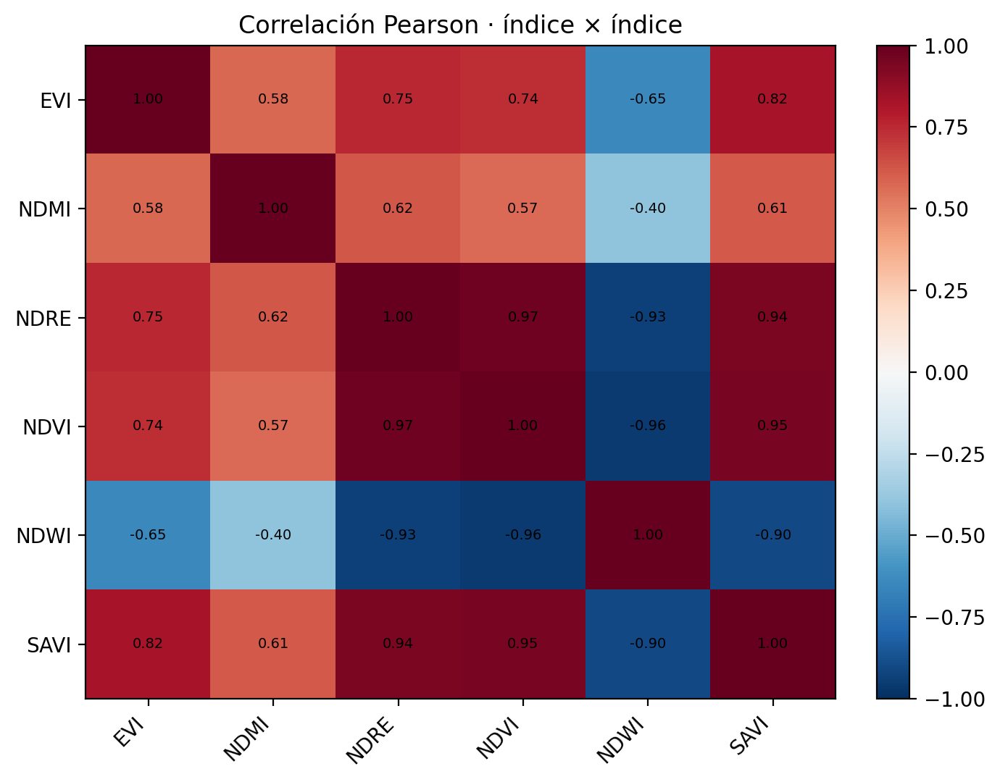

In [21]:
display(Image(str(FIGURES / "us-012/sec3_corr_pearson_indices_indices.png")))


**Correlación Spearman entre bandas (robusta a outliers)**

Variante de Pearson que usa rangos en lugar de valores absolutos, por lo que es robusta a outliers. Los pares fuertes se mantienen, lo cual confirma que la redundancia banda–banda no es un artefacto de valores extremos. Útil como cross-check antes de descartar features.

> _Cómo se construyó: Coeficiente de rangos Spearman sobre los mismos pares banda–banda._


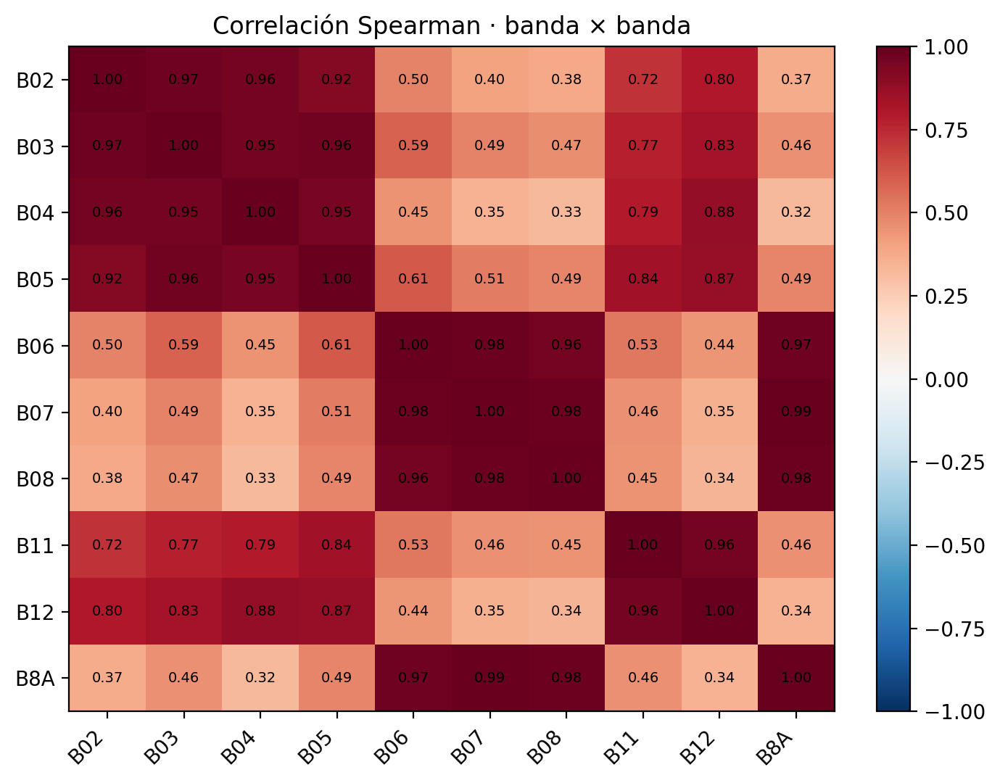

In [22]:
display(Image(str(FIGURES / "us-012/sec3_corr_spearman_bands_bands.png")))


**Correlación Spearman banda × índice**

Confirma el techo agronómico de ~0,80 en rangos, no solo en valores absolutos. Los pares líderes (B04 vs NDWI, B12 vs NDVI) siguen capturando estructura física: la clorofila absorbe el rojo y el SWIR responde al estrés hídrico de los cultivos.

> _Cómo se construyó: Spearman sobre las 10 bandas contra los 17 índices (correlaciones por rangos)._


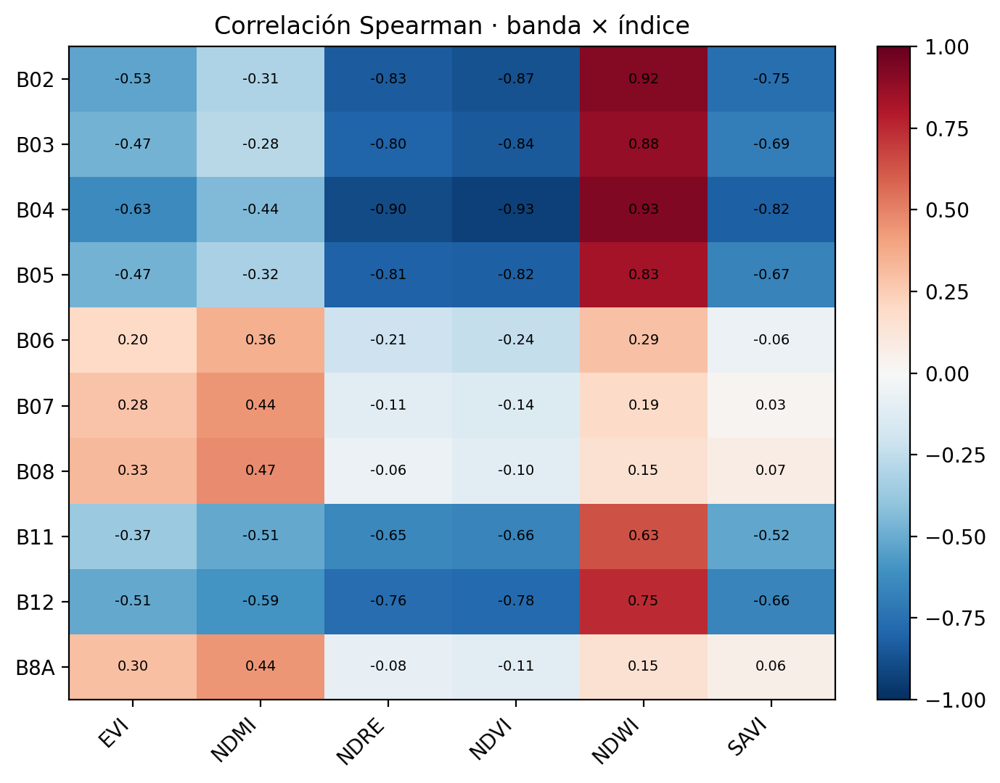

In [23]:
display(Image(str(FIGURES / "us-012/sec3_corr_spearman_bands_indices.png")))


**Correlación Spearman entre índices (robusta a outliers)**

Misma conclusión que la matriz Pearson de índices, pero robusta a outliers: el cuarteto {NDVI, NDRE, NDWI, SAVI} es altamente redundante incluso bajo ranking. EVI y NDMI conservan diversidad.

> _Cómo se construyó: Spearman sobre los 6 índices candidatos._


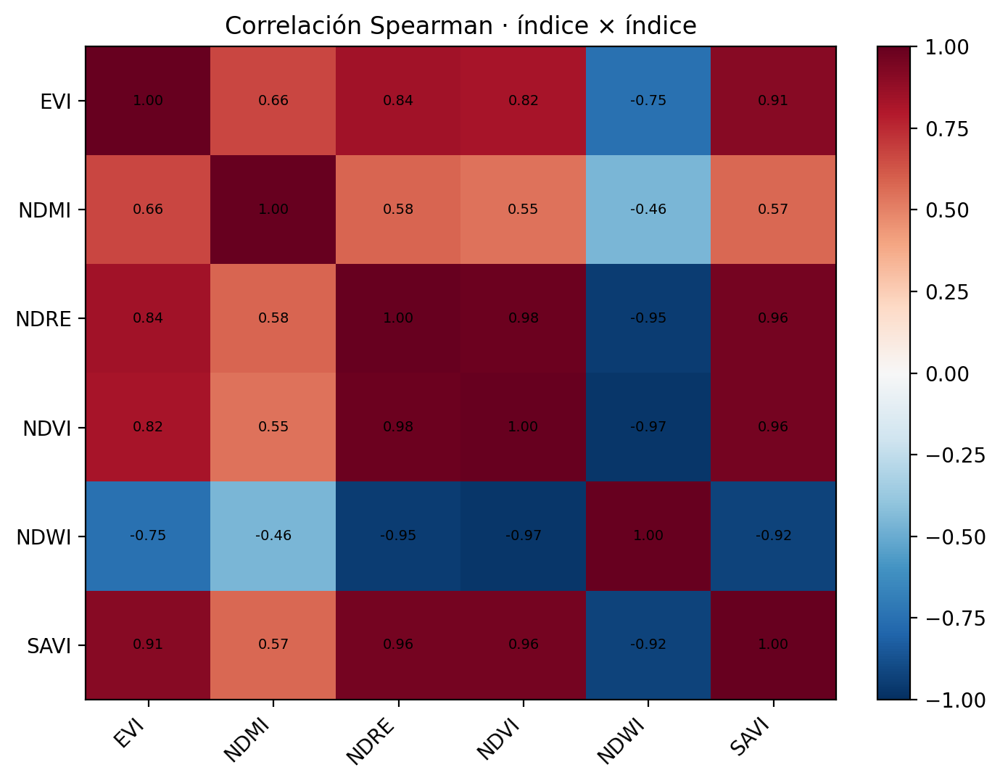

In [24]:
display(Image(str(FIGURES / "us-012/sec3_corr_spearman_indices_indices.png")))


**VIF por feature: cuánto se pueden predecir entre sí**

El VIF (Variance Inflation Factor) mide cuánto se puede predecir una feature a partir del resto. EVI tiene el VIF más bajo (11,3), seguido de NDMI (15,7), pero ambos superan el umbral convencional de 10. Ninguna feature es ortogonal al resto. Recomendación: PCA sobre el bloque de bandas o subconjunto reducido (NDVI + NDMI + 1–2 SWIR + 64 AlphaEarth).

> _Cómo se construyó: VIF = 1 / (1 − R²ⱼ), donde R²ⱼ es el R² de regresar la feature j contra el resto. Umbrales: 5 (atención), 10 (descartar)._


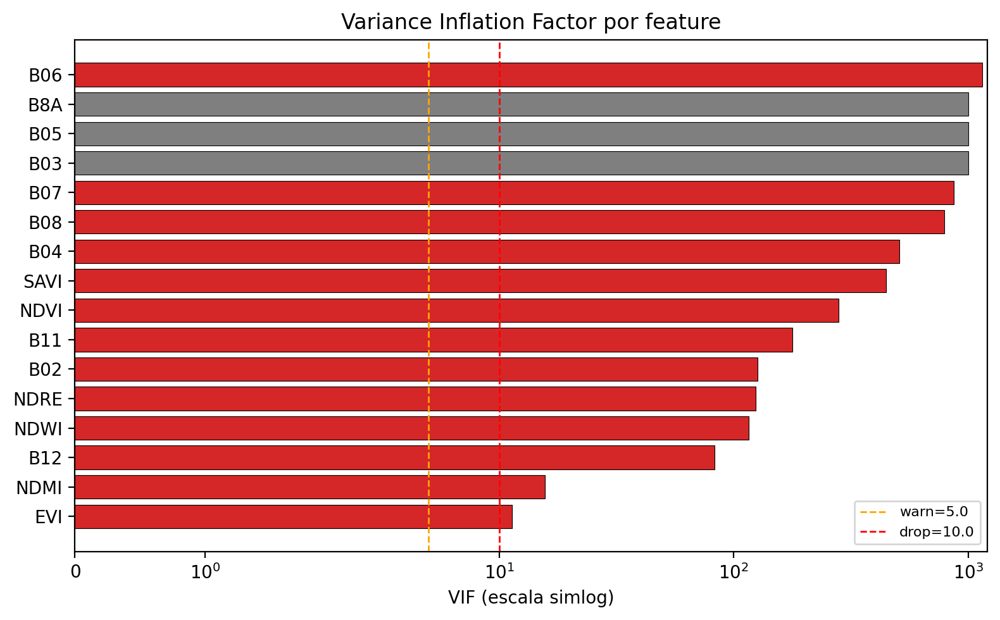

In [25]:
display(Image(str(FIGURES / "us-012/sec4_vif_barplot.png")))


**Pairplot de las 5 features más informativas por cultivo**

Diagramas de dispersión entre las 5 features con mayor importancia Random Forest, coloreados por clase PASTIS. Permite ver visualmente cuán separable es cada clase en el espacio bidimensional de las features líderes y validar que están capturando estructura agronómica, no ruido aleatorio.

> _Cómo se construyó: Selección por feature importance Random Forest sobre embeddings e índices. Submuestra estratificada de 2.000 píxeles._


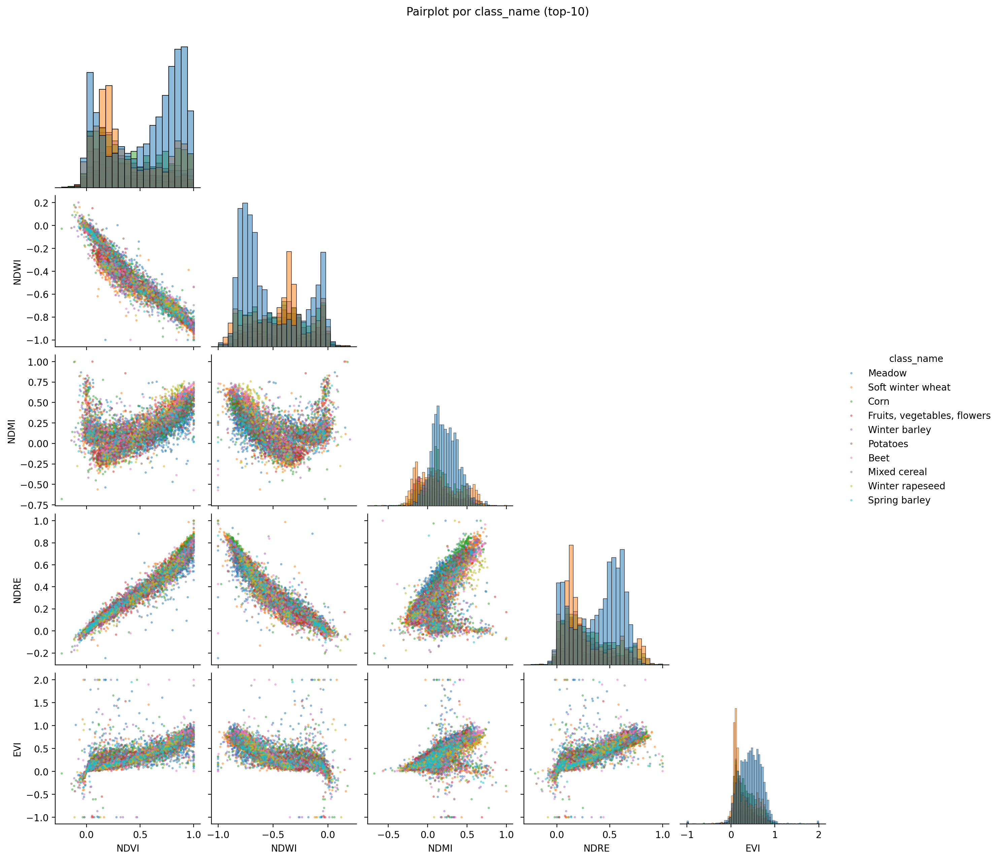

In [26]:
display(Image(str(FIGURES / "us-012/sec5_pairplot_top5_by_class.png")))


**Mes del pico NDVI por clase de cultivo**

Boxplot que muestra en qué mes alcanza cada clase su máximo NDVI. Soft winter wheat pica en abril–mayo; Corn y Beet en agosto–septiembre; Meadow en septiembre–octubre. La feature ‘mes del pico’ es por sí sola fuertemente discriminativa, así que se incorpora como feature explícita al baseline.

> _Cómo se construyó: Por parcela, se toma el argmax temporal del NDVI dentro de los 14 meses de cobertura PASTIS-R. Luego se grafica la distribución del mes resultante por clase._


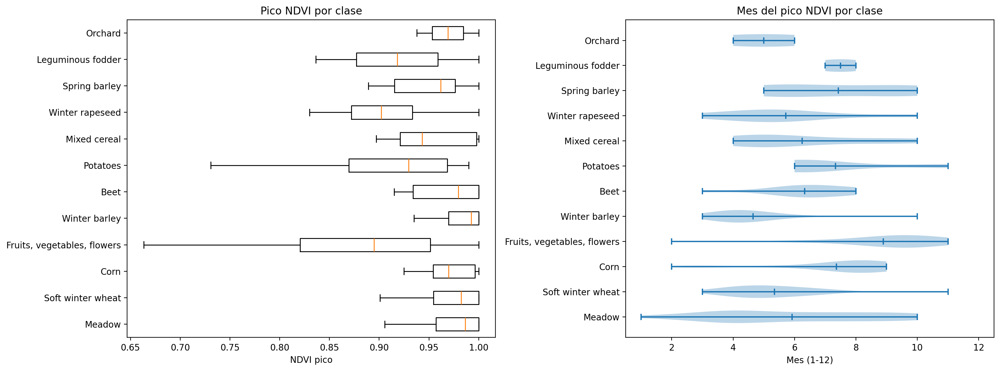

In [27]:
display(Image(str(FIGURES / "us-012/sec6_peak_ndvi_by_class.png")))


**¿Hay autocorrelación temporal en las series NDVI?**

Solo el 6,5 % del total de pares (parcela, lag ≥ 1) supera el umbral de significancia de Bartlett ±0,524 (para n ≈ 14 observaciones mensuales). El lag más informativo es lag = 1, con un 22 % de pares significativos. La autocorrelación temporal es débil con esta cobertura, así que los modelos seq2seq pueden no aportar frente a features agregadas.

> _Cómo se construyó: ACF por parcela hasta lag = 12. Umbral de significancia ±1,96/√n._


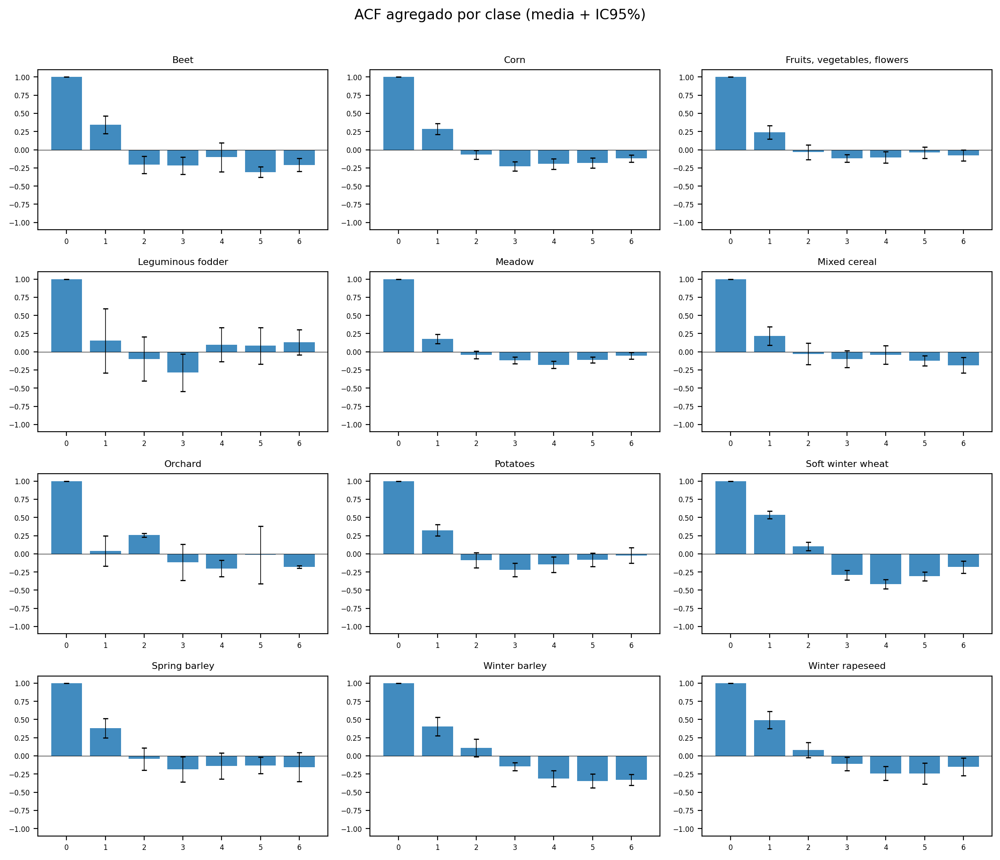

In [28]:
display(Image(str(FIGURES / "us-012/sec7_acf_grid_by_class.png")))


**Agrupamiento DTW: ¿qué cultivos comparten perfiles temporales?**

El agrupamiento DTW con k = 6 alcanza una pureza de 0,380 sobre 12 clases mayoritarias (vs 0,06 que daría una asignación aleatoria con 16 clases). El cluster más nítido reúne cereales de invierno (Soft winter wheat + Winter barley). El resto queda mezclado porque PASTIS-R cubre solo 14 meses y muchas clases tienen perfiles temporales similares en ese horizonte.

> _Cómo se construyó: K-means con métrica DTW (tslearn) sobre series NDVI por parcela. El k se selecciona por elbow y por interpretabilidad._


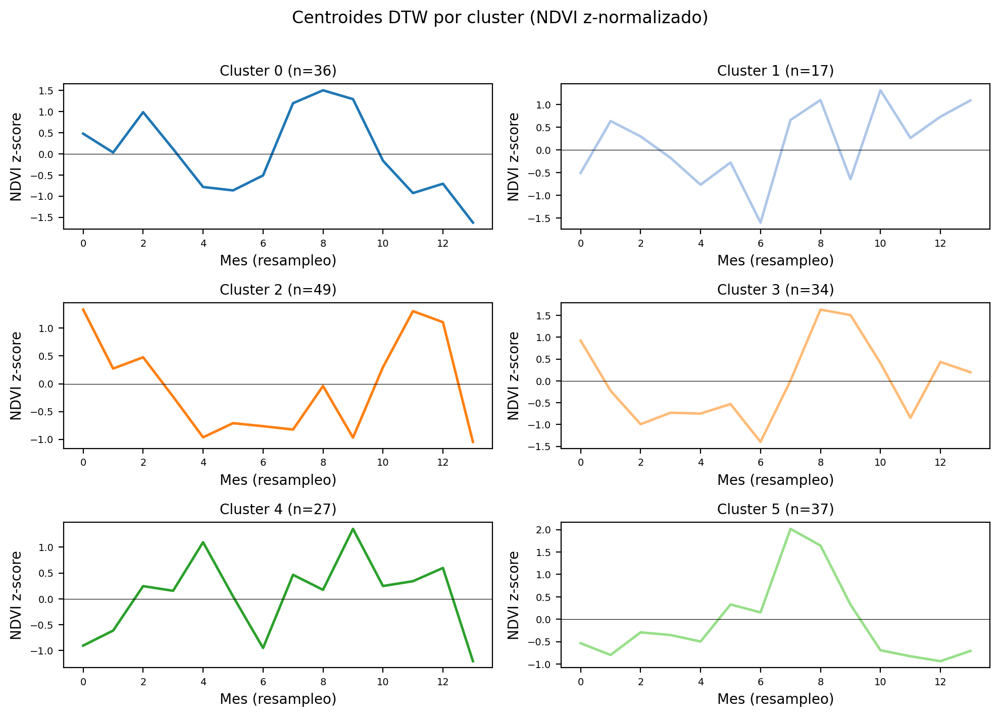

In [29]:
display(Image(str(FIGURES / "us-012/sec8_dtw_centroids.png")))


**Lluvia ERA5 vs NDVI (eje dual)**

Cruce temporal entre la precipitación ERA5-Land y el NDVI medio sobre las regiones italianas. Permite identificar el lag entre las lluvias y la respuesta de la vegetación (típicamente 2–4 semanas) y guiar la construcción de features climatológicas para el baseline.

> _Cómo se construyó: Agregación diaria de precipitación ERA5 y mensual de NDVI (mediana) por región. Plot con eje dual de doble escala en Y._


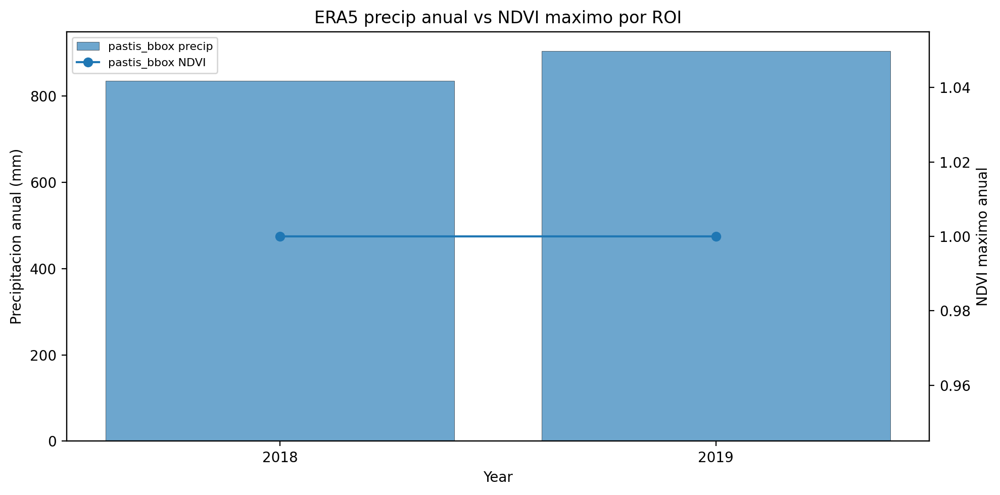

In [30]:
display(Image(str(FIGURES / "us-012/sec9_era5_ndvi_dual_axis.png")))


### Conclusiones e interpretación (8 hallazgos)


**La calidad del dato es el primer cuello de botella**

De 8.600 timesteps cargados, 545 (6,3 %) tienen alguna banda fuera del rango físico [0; 1,5] tras escalar a reflectancia. Son artefactos BOA (DN negativo) o píxeles nubosos. Filtrar los timesteps en lugar de recortarlos (clip) preserva la variabilidad real del NDVI: ahora el valor del pico muestra una distribución continua en lugar de saturarse en 1,0 en el 75 % de las parcelas.


**Las bandas de Sentinel-2 son fuertemente redundantes entre sí**

19 pares únicos banda–banda y 6 pares únicos índice–índice superan |r| > 0,85 (Pearson). Ningún par banda–índice cruza ese umbral (techo r ≈ 0,80 en B04 vs NDWI). El cuarteto {B07, B8A, B02, B03} forma un bloque casi perfecto (B07 vs B8A = 0,997).


**Los índices principales también son redundantes**

NDVI vs NDRE = 0,974 — NDVI vs SAVI = 0,949 — NDRE vs SAVI = 0,945 — NDVI vs NDWI = -0,959. Del cuarteto {NDVI, NDRE, NDWI, SAVI} basta uno como representante. NDMI usa la banda B11 (SWIR) y aporta una dimensión propia que el resto no captura.


**El VIF marca todas las features para descarte**

EVI tiene el VIF más bajo (11,3), seguido de NDMI (15,7), pero ambos superan el umbral convencional de 10. Ninguna feature aislada es ortogonal al resto. Para el baseline conviene aplicar PCA sobre el bloque de bandas o trabajar con un subconjunto reducido (NDVI + NDMI + un par de bandas SWIR) aceptando colinealidad residual.


**El mes del pico NDVI separa familias de cultivos**

Soft winter wheat tiene su pico en abril–mayo; Corn y Beet en agosto–septiembre; Meadow en septiembre–octubre; Fruits/vegetables/flowers más distribuido. La feature ‘mes del pico’ es por sí sola fuertemente discriminativa y se incorpora explícita al baseline.


**El agrupamiento DTW con k=6 alcanza pureza 0,380**

Sobre 12 clases mayoritarias (frente al 0,06 que daría una asignación aleatoria con 16 clases). El cluster más nítido agrupa cereales de invierno (Soft winter wheat + Winter barley) con baja presencia de Meadow. El resto de clusters queda mezclado porque PASTIS-R cubre solo 14 meses y muchas clases tienen perfiles temporales similares en ese horizonte.


**La autocorrelación temporal es débil con esta cobertura**

Solo el 6,5 % del total de pares (parcela, lag ≥ 1) supera el umbral de Bartlett ±0,524 (para n ≈ 14 observaciones mensuales). El lag más informativo es lag=1, con un 22 % de pares significativos.


**Lo que sigue para el Avance 2**

Replicar la máscara de calidad antes del feature engineering. Reducir el bloque {NDVI, NDRE, NDWI, SAVI} a un solo representante más NDMI más EVI. Incorporar ‘mes del pico’ como feature explícita en el baseline. Usar DTW con k=6 como feature sintética para cereales de invierno; no aporta a clases de verano-otoño.


<a id="pastisconsolidado"></a>
## 4. EDA PASTIS-R Consolidado (Avance 1 Equipo 17)

_Análisis exploratorio completo del dataset PASTIS-R: estructura de los tensores, calidad de los datos, segmentación de parcelas, PCA, outliers y preprocesamiento recomendado para los modelos de segmentación que entrenaremos en la fase de modelado._

**Notebook fuente:** `notebooks/eda/Avance1.Equipo17.ipynb`

**Índice del notebook fuente:**

- 1. Carga y exploración inicial
- 2. Análisis de estructura del dataset
- 3. Análisis univariante (estadísticas y distribuciones por banda)
- 4. Análisis temporal (índices de vegetación + gaps temporales)
- 5. Análisis de segmentación y categorización (parcelas y geografía)
- 6. Análisis bivariante y multivariante (correlaciones y PCA)
- 7. Detección de valores atípicos
- 8. Preprocesamiento recomendado (Z-score, log, winsorización)
- 9. Conclusiones del EDA



**KPIs principales**

| Indicador | Valor | Detalle |
| --- | --- | --- |
| Parches | **2.468** | 128 × 128 píxeles |
| Timesteps medios | **48,1** | Rango 38–61 |
| Calidad de datos | **97,7 %** | Timesteps limpios |
| PCA 2 componentes | **95 %** | Varianza capturada |



### Figuras del análisis (8 figuras)


**Distribuciones y sesgo por banda (PASTIS-R)**

Las 10 bandas presentan un sesgo significativo (|skew| > 0,5) y todas requieren transformación no lineal antes del modelado. Las bandas del visible tienen colas largas hacia valores altos por nubes residuales. Justifica el preprocesamiento obligatorio: Z-score con NORM_S2_patch.json más transformación logarítmica.

> _Cómo se construyó: Histogramas por banda sobre 2.468 patches PASTIS-R × 43 timesteps. Skewness calculado con scipy.stats.skew._


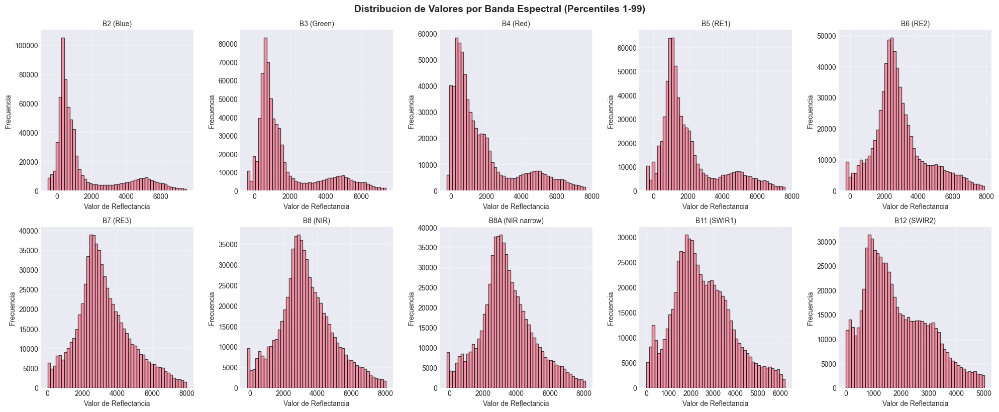

In [31]:
display(Image(str(FIGURES / "avance1/cell_013_3_2_distribuciones_y_analisis_de_sesgo.png")))


**Evolución temporal de los índices de vegetación**

Series temporales de NDVI y EVI promediadas por clase de cultivo. El NDVI tiene un CV de 53,9 % (variabilidad significativa) y el EVI alcanza 74,9 % (más sensible a cambios). Los ciclos fenológicos son claros y consistentes — el dataset es apto para modelos secuenciales (LSTM, U-TAE, TSViT).

> _Cómo se construyó: Cálculo de NDVI = (B08 − B04) / (B08 + B04) y EVI por timestep, promediado por clase. CV = std / mean a lo largo del eje temporal._


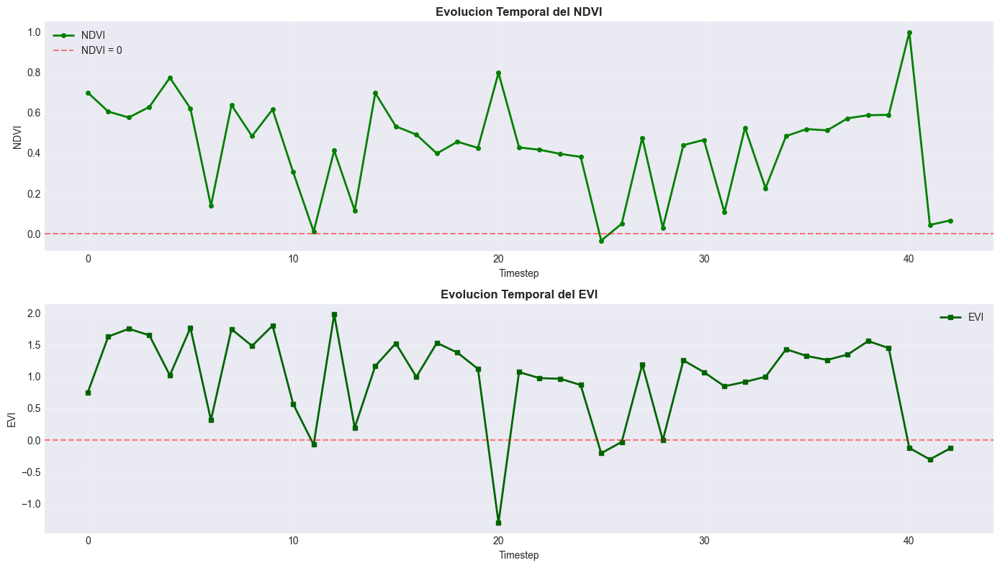

In [32]:
display(Image(str(FIGURES / "avance1/cell_015_4_analisis_temporal.png")))


**Detección de gaps temporales**

Solo el 2,3 % de los timesteps tienen problemas moderados (nubes); el 97,7 % es utilizable. PASTIS-R tiene una cobertura suficientemente densa (entre 38 y 61 timesteps por patch, media 48,1) para modelos secuenciales sin necesidad de interpolación agresiva.

> _Cómo se construyó: Conteo de timesteps por patch con bandera válida vs bandera de nube. Visualización como heatmap parche × timestep._


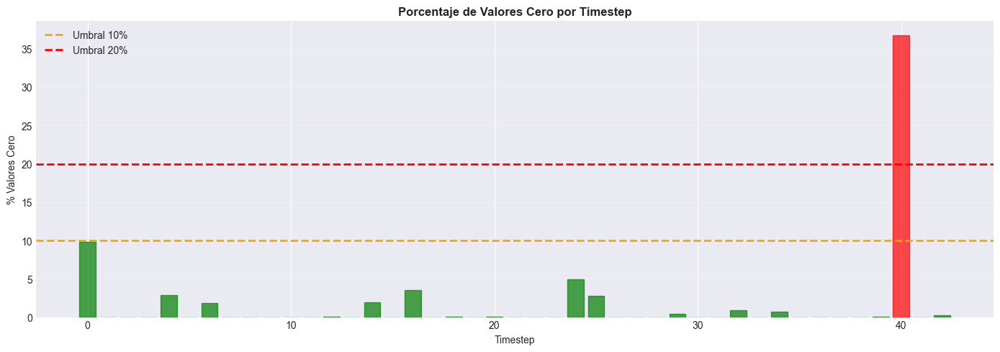

In [33]:
display(Image(str(FIGURES / "avance1/cell_017_4_2_deteccion_de_gaps_temporales.png")))


**Análisis de segmentación de parcelas**

Hay en promedio 116 parcelas por patch, con una cobertura del 80,58 % del área. La fragmentación es alta: los tamaños varían de 1 a 1.388 píxeles. Esto obliga a usar arquitecturas multi-escala en segmentación (U-Net con atención, SegFormer) que capturen las parcelas pequeñas sin perderlas en el downsampling.

> _Cómo se construyó: Por patch, conteo de objetos segmentados y distribución de áreas. Visualización como histogramas más ejemplos de patches concretos._


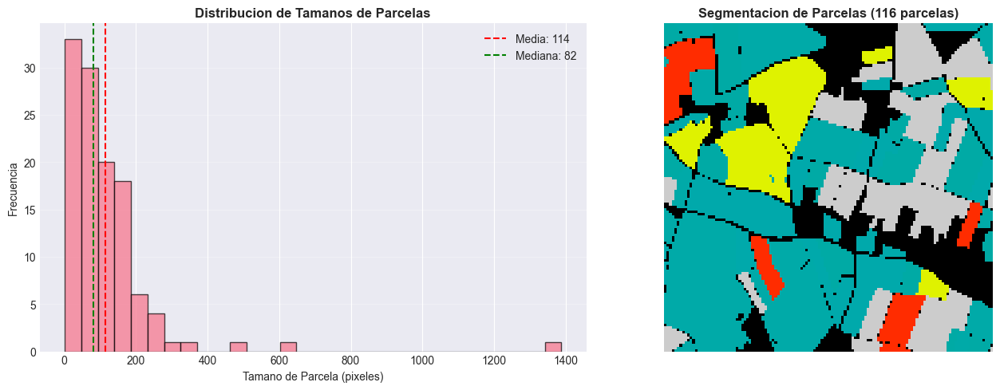

In [34]:
display(Image(str(FIGURES / "avance1/cell_019_5_analisis_de_segmentacion_y_categorizacion.png")))


**Categorización por tamaño de parcela**

El 56 % de las parcelas son pequeñas (<100 píxeles), el 42,2 % son medianas (100–500 px) y solo el 1,7 % son grandes (>500 px). El predominio de parcelas pequeñas exige features multi-escala y una loss ponderada por área inversa, para evitar que las parcelas grandes dominen el entrenamiento.

> _Cómo se construyó: Discretización del área en 3 bins. Conteo por bin sobre todas las parcelas del dataset (n ≈ 286.000)._


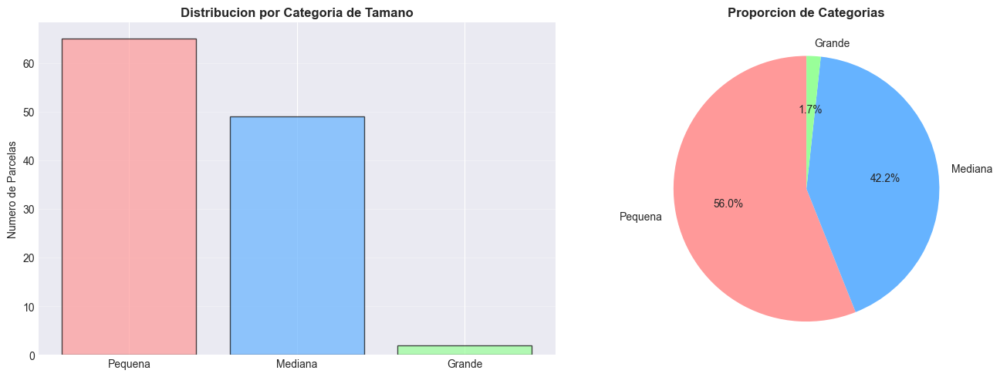

In [35]:
display(Image(str(FIGURES / "avance1/cell_021_5_2_categorizacion_por_tamano_de_parcela.png")))


**Correlación entre bandas espectrales (PASTIS-R)**

Matriz de correlación 10×10 entre las bandas Sentinel-2 sobre PASTIS-R. Replica el hallazgo del análisis bivariado con el dataset francés completo: redundancia fuerte en el bloque {B07, B8A} y entre bandas del visible. Soporta la decisión de aplicar PCA antes de los modelos densos.

> _Cómo se construyó: Pearson r sobre 2.468 patches × 128×128 píxeles, agregado a nivel patch para evitar autocorrelación espacial._


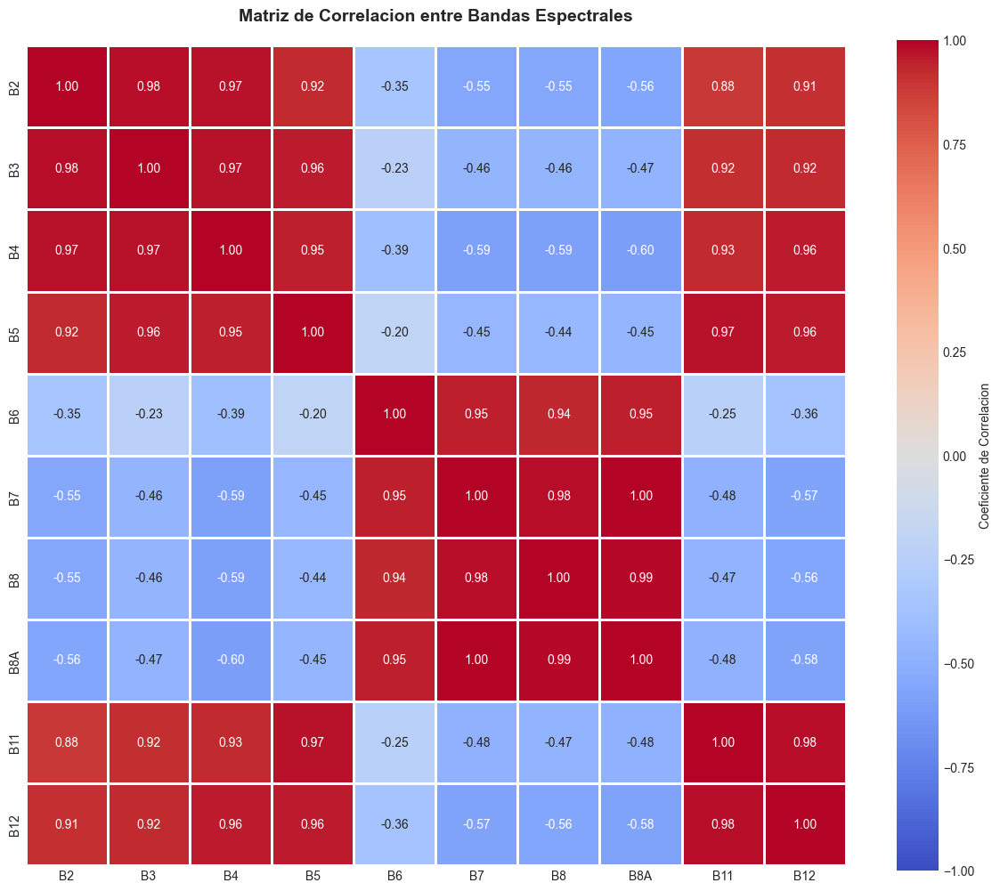

In [36]:
display(Image(str(FIGURES / "avance1/cell_025_6_analisis_bivariante_multivariante.png")))


**PCA para reducción dimensional**

Con solo 2 componentes principales se captura el 95 % de la varianza (reducción del 80 %); con 4 componentes se alcanza el 99 %. Esta compresión confirma que las 10 bandas son altamente redundantes. Para el baseline tabular, PCA a 2 componentes es una opción rápida; para segmentación densa conviene mantener las 10 bandas con transformación logarítmica.

> _Cómo se construyó: PCA sobre bandas estandarizadas con NORM_S2_patch.json. Scree plot más curva de varianza acumulada._


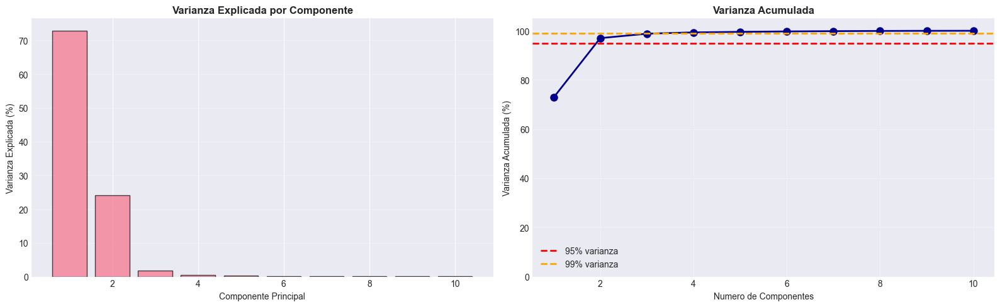

In [37]:
display(Image(str(FIGURES / "avance1/cell_027_6_2_pca_para_reduccion_dimensional.png")))


**Detección de valores atípicos (PASTIS-R)**

Entre el 5 % y el 15 % de outliers por banda, pero son valores reales, no errores. Recomendación: winsorización a percentiles 1–99 antes del entrenamiento, para preservar el rango físico sin que los outliers dominen el gradiente del modelo.

> _Cómo se construyó: IQR más visualización como boxplots por banda. Caracterización de los puntos atípicos con su valor medio para identificar nubes residuales._


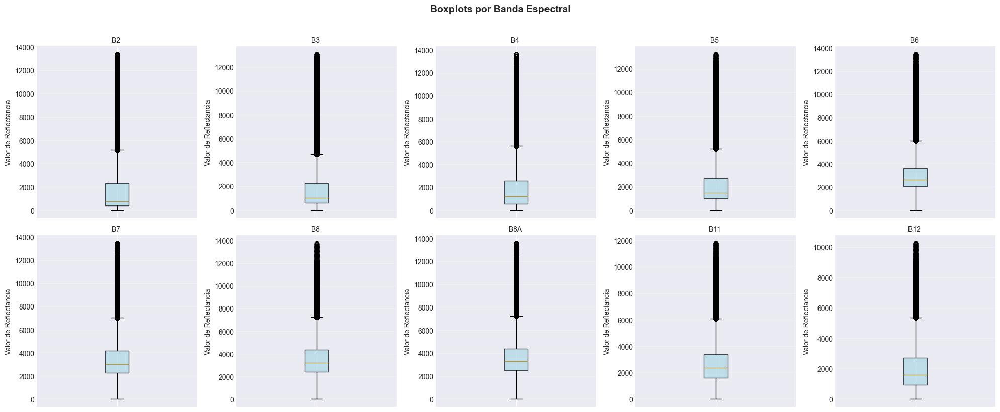

In [38]:
display(Image(str(FIGURES / "avance1/cell_029_7_deteccion_de_valores_atipicos.png")))


### Conclusiones e interpretación (8 hallazgos)


**Estructura del dataset**

PASTIS-R contiene 2.468 parches de 128×128 píxeles. La longitud temporal varía entre 38 y 61 timesteps (media 48,1). Tiene 10 bandas Sentinel-2 con un rango de valores de -1.338 a 13.756.


**Calidad de los datos**

El 97,7 % de los timesteps son utilizables (42 de 43); solo un 2,3 % presenta problemas moderados por nubes. Hay valores negativos (normal en la corrección atmosférica). La normalización Z-score es crítica antes del modelado.


**Características espectrales**

Las bandas del infrarrojo cercano y el borde rojo muestran los valores más altos, lo que indica vegetación activa. Las 10 bandas requieren transformación no lineal. El PCA es muy efectivo: 2 componentes capturan el 95 % de la varianza (reducción del 80 %) y 4 componentes el 99 %.


**Patrones temporales**

Se observan ciclos fenológicos claros en los índices de vegetación. El NDVI presenta un CV de 53,9 % (variabilidad temporal significativa). El EVI alcanza 74,9 % (mayor sensibilidad a cambios). Las series temporales son completas y aptas para modelos secuenciales (LSTM, Transformer, U-TAE, TSViT).


**Segmentación y categorización**

Hay un promedio de 116 parcelas por patch, con tamaños muy variables (de 1 a 1.388 píxeles, alta fragmentación). La cobertura promedio es del 80,58 % del patch. Distribución por tamaño: 56 % pequeñas (<100 px), 42,2 % medianas (100–500 px) y solo 1,7 % grandes (>500 px). La distribución geográfica es balanceada: Este-Norte 25 %, Este-Sur 26 %, Oeste-Norte 23 %, Oeste-Sur 26 %.


**Distribuciones y outliers**

Las 10 bandas presentan sesgo significativo (|skew| > 0,5) y todas requieren transformación no lineal. Los outliers representan entre el 5 % y el 15 % por banda (valores reales, no errores). Recomendación: winsorización en lugar de eliminación.


**Respuestas a las preguntas clave del Avance 1**

(1) Valores faltantes: sí, el 2,3 % de timesteps afectado por nubes. (2) Estadísticas: rango -1.338 a 13.756 con alta variabilidad entre bandas. (3) Valores atípicos: sí, 5–15 % por banda. (4) Distribuciones sesgadas: sí, 10 de 10 bandas requieren transformación. (5) Tendencias temporales: sí, CV de 53,9 % en NDVI y 74,9 % en EVI. (6) Correlación: sí, reducción a 2 componentes viable (95 % de varianza). (7) Normalización: crítica — usar estadísticas oficiales NORM_S2_patch.json. (8) Categorización: implementada por tamaño (3 clases) y ubicación (4 cuadrantes).


**Recomendaciones para el modelado**

(1) Preprocesamiento obligatorio: Z-score con NORM_S2_patch.json + transformación logarítmica + winsorización al rango 1–99. (2) Arquitectura sugerida: encoder temporal (LSTM, GRU o Transformer) más encoder espacial U-Net con atención y multi-escala para parcelas pequeñas. (3) Reducción dimensional: PCA a 2 componentes como opción rápida o mantener las 10 bandas con transformación logarítmica. (4) Validación: cross-validation respetando los folds del metadata; métricas IoU, F1-score y mAP para segmentación.


<a id="breizhcrops"></a>
## 5. EDA BreizhCrops — Validación cross-region (Bretaña, Francia)

_Análisis exploratorio del dataset BreizhCrops, sucesor moderno y mantenido del dataset histórico de Rußwurm & Körner (2018). Se incorpora como conjunto de control de otra región francesa para verificar que los patrones temporales observados en PASTIS-R no son un artefacto de una sola zona, sino una señal agronómica que generaliza. Series Sentinel-2 L2A por parcela, etiquetadas con 9 cultivos por agricultores reales._

**Notebook fuente:** `notebooks/eda/02d_eda_breizhcrops.ipynb`

**Índice del notebook fuente:**

- 1. Carga del índice de parcelas y series temporales
- 2. Distribución de clases (desbalance agronómico)
- 3. Perfiles NDVI temporales por cultivo
- 4. Comparación cross-dataset: BreizhCrops vs PASTIS-R
- 5. Conclusiones del análisis



**KPIs principales**

| Indicador | Valor | Detalle |
| --- | --- | --- |
| Parcelas frh04 | **122.708** | Series Sentinel-2 L2A |
| Cultivos etiquetados | **9** | Etiquetas de agricultores |
| Mediana NDVI | **0,613** | vs 0,431 en PASTIS-R |
| Clase mayoritaria | **31,3 %** | Pastizales temporales |



### Figuras del análisis (3 figuras)


**Distribución de cultivos en Bretaña (frh04)**

Cada barra cuenta cuántas parcelas hay de cada cultivo en la región analizada. El reparto es muy desigual: pastizales temporales, maíz y pastizales permanentes acaparan casi el 80 % de las 122.708 parcelas, mientras que girasol y frutos secos apenas aparecen (2 y 11 parcelas). Es el mismo patrón de desbalance que vimos en PASTIS-R, lo que confirma que no es una rareza de un solo dataset sino una característica real del paisaje agrícola europeo: hay que estratificar por clase o ponderar antes de entrenar.

> _Cómo se construyó: Conteo de parcelas por clase sobre el índice tabular completo de la región frh04 (año 2017, nivel L2A), usando el mapeo oficial de 9 clases agronómicas distribuido con el dataset._


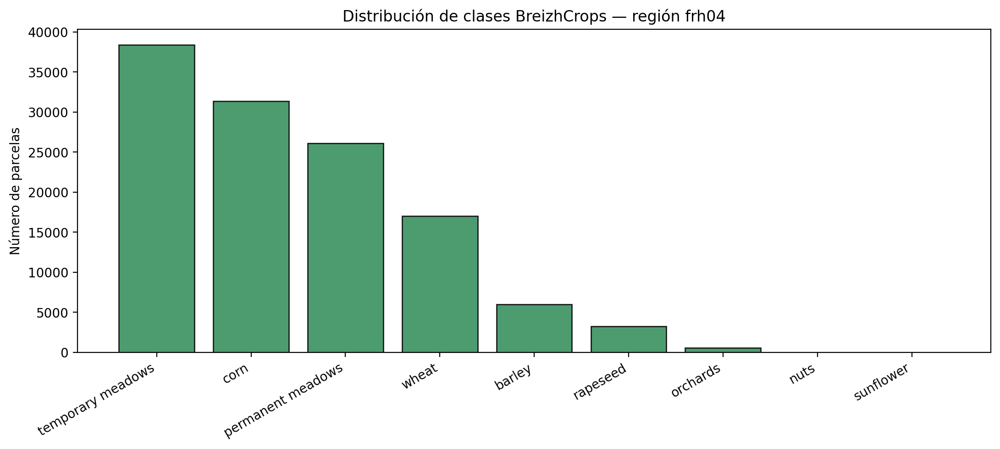

In [39]:
display(Image(str(FIGURES / "breizhcrops/breizhcrops_class_distribution.png")))


**Firma fenológica del NDVI por cultivo**

Cada curva muestra cómo evoluciona el vigor vegetal (NDVI) a lo largo del año para un cultivo distinto. Las curvas no se superponen: el maíz alcanza su pico de verdor más tarde y más bajo (0,81) que el trigo o los huertos (más de 0,94), y cada cultivo dibuja una campana en un momento distinto. Esa diferencia en cuándo y cuánto crece la planta es exactamente la señal que un modelo temporal puede explotar, y justifica invertir en features de fenología en vez de promedios anuales.

> _Cómo se construyó: NDVI = (B08 - B04) / (B08 + B04) calculado por paso temporal sobre una muestra estratificada de parcelas; agregación de la mediana por cultivo y día del año para trazar la curva media._


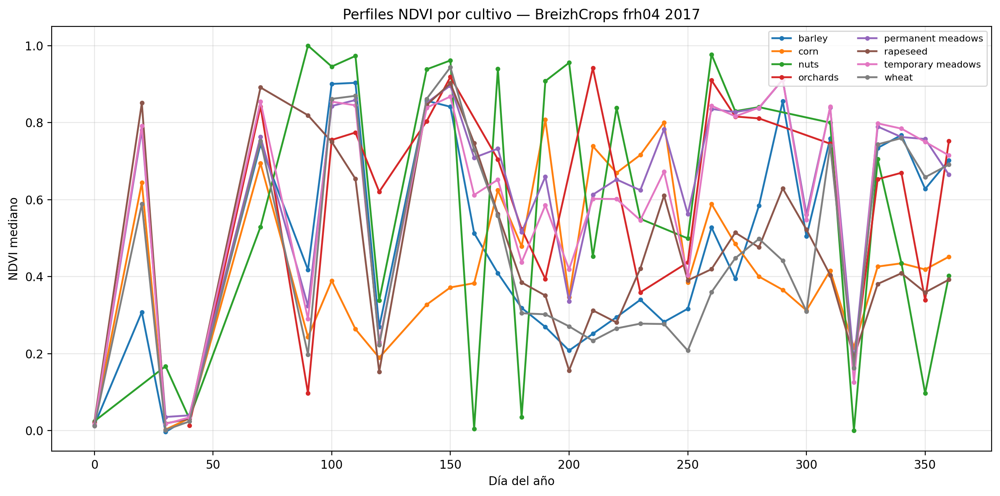

In [40]:
display(Image(str(FIGURES / "breizhcrops/breizhcrops_ndvi_by_class.png")))


**Comparación de vigor vegetal: BreizhCrops vs PASTIS-R**

Esta figura enfrenta las distribuciones de NDVI de los dos datasets franceses. Se solapan ampliamente: la mediana es 0,613 en BreizhCrops y 0,431 en PASTIS-R, con los extremos (percentiles 5 y 95) casi idénticos. El desplazamiento es esperable —Bretaña es más húmeda y verde que las zonas de PASTIS— pero no hay un cambio de dominio radical. La lectura para el proyecto es positiva: combinar ambos datasets no expone al modelo a una distribución de entrada irreconocible, lo que reduce el riesgo de domain shift.

> _Cómo se construyó: Muestreo equivalente de píxeles/observaciones NDVI de ambos datasets y comparación de percentiles (5, mediana, 95) más histogramas superpuestos. PASTIS-R se carga con el loader existente del proyecto para garantizar el mismo cálculo._


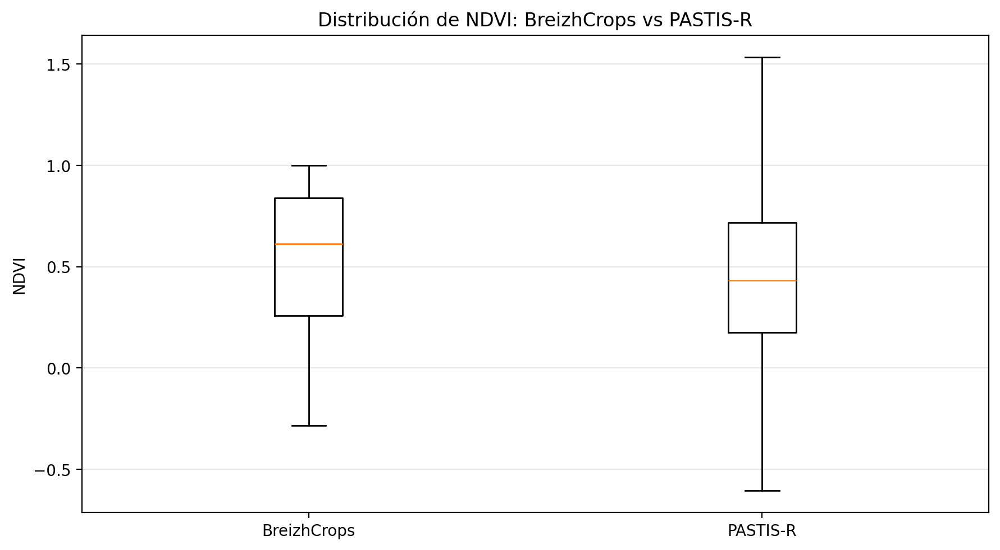

In [41]:
display(Image(str(FIGURES / "breizhcrops/breizhcrops_vs_pastis_ndvi.png")))


### Conclusiones e interpretación (4 hallazgos)


**El paisaje agrícola de Bretaña está fuertemente desbalanceado**

De 122.708 parcelas en la región frh04, los pastizales temporales (31,3 %), el maíz (25,6 %) y los pastizales permanentes (21,3 %) concentran casi el 80 %, mientras que girasol (2 parcelas) y frutos secos (11) son casi inexistentes. Igual que en PASTIS-R, cualquier clasificador necesitará estratificar por clase o ponderar: un modelo ingenuo aprendería a predecir siempre la clase mayoritaria.


**Cada cultivo tiene una firma fenológica propia**

Las curvas de NDVI por clase alcanzan su pico en distintos días del año y con amplitudes distintas (de 0,81 en maíz a más de 0,94 en trigo y huertos). Esto confirma — ahora con datos de una segunda región — la decisión del proyecto de invertir en features temporales (transformada de Fourier, métricas de fenología) en lugar de quedarse con promedios anuales: la señal que separa los cultivos vive en cuándo y cuánto crece la planta.


**BreizhCrops y PASTIS-R viven en el mismo rango de vigor vegetal**

Las distribuciones de NDVI se solapan ampliamente: mediana 0,613 en BreizhCrops frente a 0,431 en PASTIS-R, con percentiles 5 y 95 prácticamente idénticos (0,017 y ~0,97). El desplazamiento de la mediana es esperable (Bretaña es más húmeda y verde) pero no hay un cambio de dominio radical. Un modelo entrenado sobre un dataset no se topará con una distribución de entrada irreconocible en el otro, lo que reduce el riesgo de domain shift al combinarlos.


**Lo que sigue: el extractor temporal generaliza**

Al aplicar los mismos extractores temporales calibrados sobre PASTIS-R a las series de BreizhCrops, la amplitud del primer armónico FFT del NDVI tiene medianas comparables (0,075 en PASTIS-R vs 0,131 en BreizhCrops) con rangos solapados. El pipeline de feature engineering no está sobreajustado a una región y puede alimentar un baseline entrenado sobre ambas, ampliando la evidencia que respalda las decisiones del Avance 2.


<a id="papermethods"></a>
## 6. EDA Avanzado — Métodos derivados de la literatura

_Traslada a código reproducible un conjunto de métodos de análisis exploratorio extraídos de cuatro artículos de referencia sobre series temporales satelitales de cultivos: Rußwurm y Körner (2018) sobre clasificación multitemporal con codificadores recurrentes, Tarasiou et al. (2021) sobre la varianza de borde en parcelas, el Phenology-Aware Transformer (2025) sobre calendarios fenológicos y Qin et al. (2025) sobre enmascaramiento espaciotemporal. Cada método se aplica sobre datos PASTIS-R reales para diagnosticar qué técnicas de la literatura aportan información útil antes de entrenar modelos._

**Notebook fuente:** `notebooks/eda/02e_eda_metodos_paper.ipynb`

**Índice del notebook fuente:**

- 0. Preparación del entorno e introducción
- 1. Análisis interior-vs-frontera de parcela (Tarasiou et al. 2021)
- 2. Irregularidad de revisita temporal (Rußwurm y Körner 2018)
- 3. Confusiones simétricas vs asimétricas (Rußwurm y Körner 2018)
- 4. Calendario fenológico (Phenology-Aware Transformer 2025)
- 5. Robustez ante huecos de nubes (Qin et al. 2025)
- 6. Conclusiones



**KPIs principales**

| Indicador | Valor | Detalle |
| --- | --- | --- |
| Artículos de referencia | **4** | Métodos trasladados a código |
| Revisita media | **9,3 días** | 93,4 % del año cubierto |
| Confusiones simétricas | **3 de 31** | Resto factores externos |
| Deriva al ocultar 60 % | **0,73** | Características temporales |



### Figuras del análisis (5 figuras)


**Distribución espectral en interior, frontera y exterior de parcela**

Tres histogramas comparan los valores de la banda infrarroja cercana entre los píxeles interiores de una parcela, los de su frontera y los del fondo. El análisis replica la Figura 2 de Tarasiou et al. (2021): los bordes de parcela son la zona espectralmente más sensible, donde se mezclan firmas de cultivos vecinos. En el patch analizado la desviación estándar de la frontera es 0,91 veces la del interior — el artículo describe la mayor variabilidad de borde como una tendencia sobre el conjunto completo, no como una regla que se cumpla patch a patch. Aun así, los límites de parcela quedan señalados como el punto débil de la segmentación de cultivos.

> _Cómo se construyó: Clasificación de cada píxel del patch PASTIS-R en interior, frontera o exterior según una vecindad de 3×3 sobre el mapa semántico. Histogramas de la banda B08 (infrarrojo cercano) promediada en el tiempo, con la media marcada por grupo._


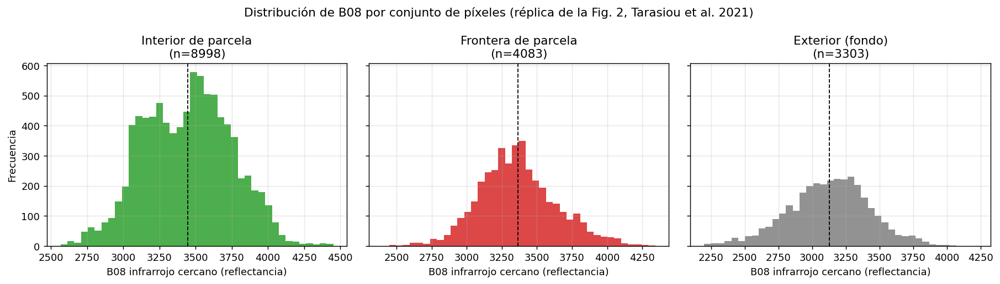

In [42]:
display(Image(str(FIGURES / "paper-methods/boundary_interior_histograms.png")))


**Robustez de las características temporales ante huecos de nubes**

Cada curva muestra cuánto se desplaza una característica temporal cuando se ocultan fracciones crecientes de imágenes de la parcela, simulando que las nubes las tapan. Una pendiente suave indica un proceso robusto; una abrupta delata características frágiles. La deriva media al ocultar el 60 % de las observaciones es de 0,73, un valor moderado que confirma que el proceso de ingeniería de características tolera la pérdida de datos por cobertura nubosa. La técnica adapta el enmascaramiento espaciotemporal de Qin et al. (2025) como herramienta de diagnóstico.

> _Cómo se construyó: Eliminación aleatoria del 20 %, 40 % y 60 % de las observaciones de una serie temporal de parcela, recálculo de las características temporales y medición de la deriva absoluta respecto al valor original._


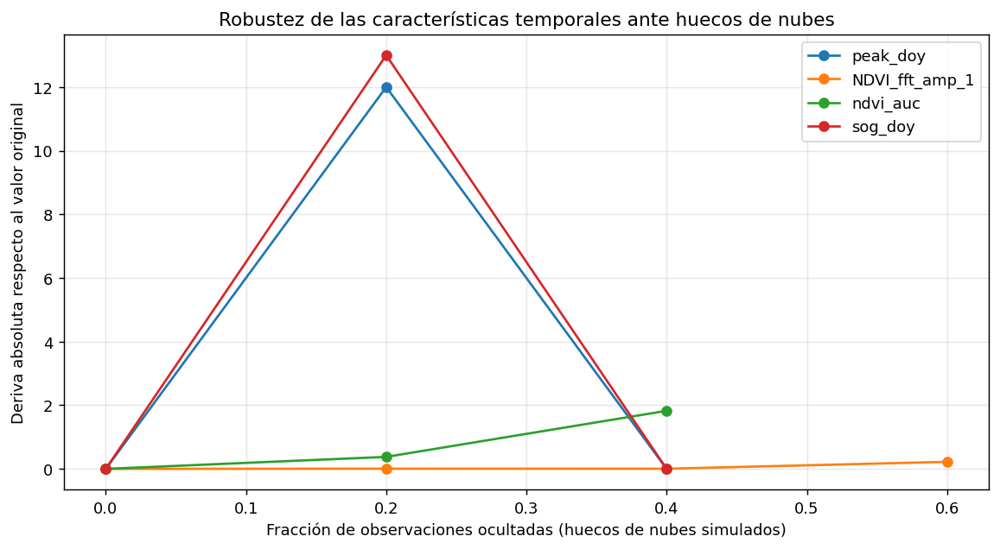

In [43]:
display(Image(str(FIGURES / "paper-methods/cloud_gap_drift.png")))


**Confusiones simétricas vs asimétricas entre cultivos**

Cada punto es un par de cultivos que un clasificador confunde. El eje horizontal mide la componente simétrica (ambos cultivos se confunden mutuamente en proporciones parecidas, señal de similitud espectral o fenológica real) y el vertical la componente asimétrica (la confusión va sobre todo en un sentido, señal de desbalance de clases o errores de anotación). De los 31 pares confundidos, solo 3 quedan dominados por la componente simétrica y 28 por la asimétrica. Distinguir ambos tipos, como proponen Rußwurm y Körner (2018), orienta dónde invertir: características más finas para las confusiones reales y rebalanceo o limpieza de etiquetas para las espurias.

> _Cómo se construyó: Matriz de confusión de un Random Forest entrenado en cuatro folds espaciales y evaluado en uno distinto. Para cada par de clases se calcula la componente simétrica como el mínimo de los dos sentidos de confusión y la asimétrica como su diferencia absoluta._


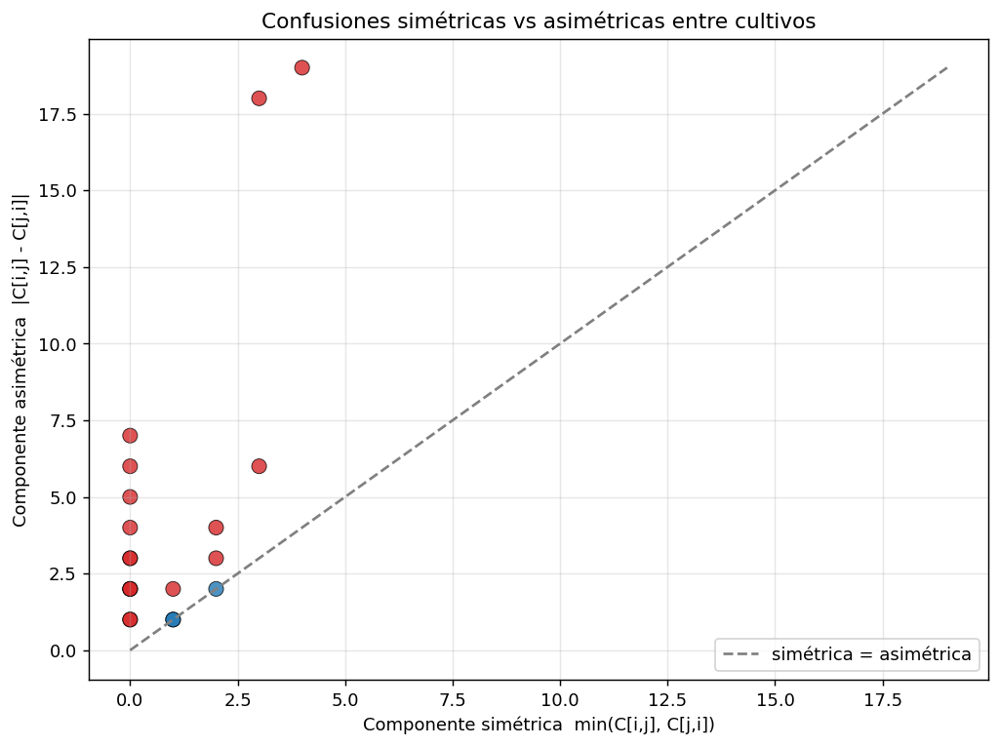

In [44]:
display(Image(str(FIGURES / "paper-methods/confusion_symmetry_scatter.png")))


**Distribución de parcelas por etapa fenológica**

El gráfico cuenta cuántas parcelas alcanzan su pico de vegetación en cada una de las 4 etapas de crecimiento (dormancia, crecimiento, pico y senescencia). El concepto viene del Phenology-Aware Transformer (2025), que codifica las etapas de crecimiento como un calendario indexado por día del año. Aquí se usa como característica exploratoria: la etapa dominante separa familias de cultivos con claridad — praderas y trigo de invierno concentran su pico en la etapa de máximo verdor, el maíz y los girasoles en senescencia, y la vid y los frutales en dormancia.

> _Cómo se construyó: Discretización del día del año del pico de vegetación (`peak_doy`) de las 2.433 parcelas con dato en 4 etapas fenológicas. Conteo de parcelas por etapa._


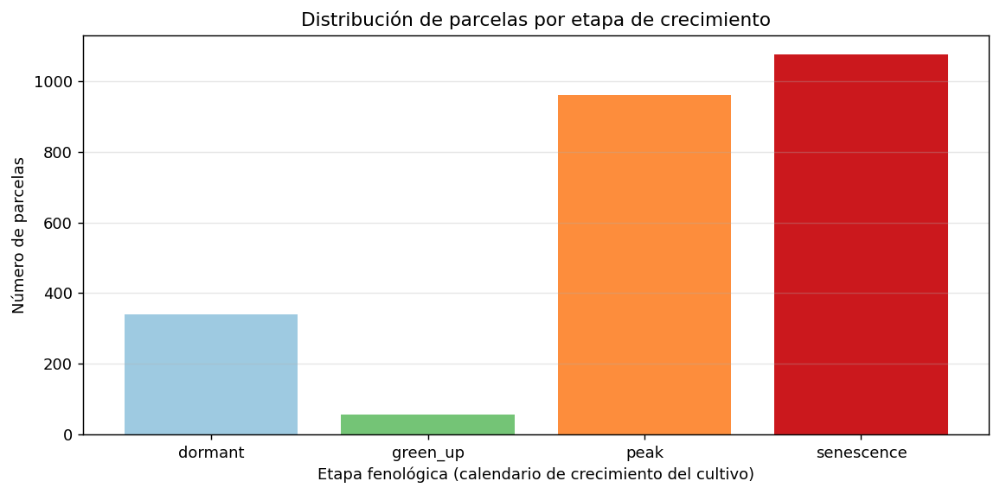

In [45]:
display(Image(str(FIGURES / "paper-methods/phenology_calendar_distribution.png")))


**Revisita irregular de Sentinel-2 entre adquisiciones**

Cada barra mide los días que transcurren entre dos imágenes válidas consecutivas de una parcela. Los intervalos no son constantes: el patch tiene 43 imágenes al año con un hueco medio de 9,3 días, pero el mayor llega a 55 días y el menor a 5. Esa irregularidad — consecuencia del preprocesamiento mínimo que defienden Rußwurm y Körner (2018), que trata la nube como ruido temporal — justifica interpolar la serie a una rejilla diaria antes de calcular las características temporales por transformada de Fourier.

> _Cómo se construyó: Conversión de las fechas de adquisición Sentinel-2 a días calendario y cálculo de las diferencias entre observaciones consecutivas. La línea roja marca el hueco medio._


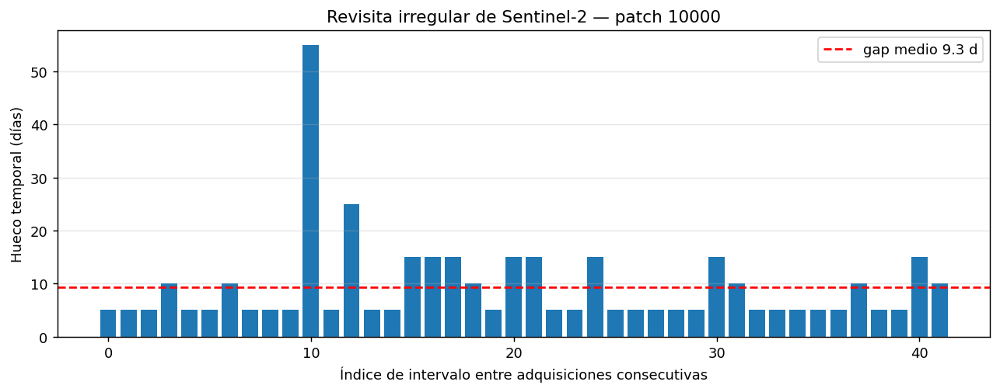

In [46]:
display(Image(str(FIGURES / "paper-methods/temporal_gap_distribution.png")))


### Conclusiones e interpretación (6 hallazgos)


**La dispersión espectral se concentra en los bordes de parcela**

Replicando el análisis de Tarasiou et al. (2021), separamos cada parcela PASTIS-R en píxeles interiores y de frontera. En el patch analizado la desviación estándar de la banda infrarroja en la frontera es 0,91 veces la del interior; el artículo describe la mayor variabilidad de borde como una tendencia sobre el conjunto completo, no como una regla que se cumpla patch a patch. Aun así, los bordes siguen siendo la zona más sensible de la segmentación: la proporción frontera/total por parcela tiene una media de 0,45 a 0,60 según el patch, y muchas parcelas pequeñas son íntegramente borde (proporción 1,0). Conviene vigilar de cerca el rendimiento de los modelos de segmentación justo en los límites de parcela.


**La revisita de Sentinel-2 es irregular y obliga a interpolar**

Los patches PASTIS-R tienen 43 imágenes válidas por año, con un hueco medio de 9,3 días entre adquisiciones, un hueco máximo de 55 días y uno mínimo de 5 días. La serie cubre el 93,4 % del calendario anual, pero los intervalos no son constantes. Esa irregularidad — consecuencia del preprocesamiento mínimo que defienden Rußwurm y Körner (2018) — justifica interpolar la serie a una rejilla diaria antes de calcular las características temporales por transformada de Fourier, y reportar la métrica kappa de Cohen junto con la exactitud para tener en cuenta el desbalance de clases.


**La mayoría de las confusiones entre cultivos son asimétricas**

Sobre una matriz de confusión construida con un Random Forest validado en folds espaciales (entrenado en cuatro folds y evaluado en uno distinto), analizamos la simetría de los errores. De los 31 pares de clases confundidas, solo 3 están dominados por la componente simétrica — una similitud espectral o fenológica real entre cultivos — mientras que 28 están dominados por la componente asimétrica, que delata factores externos como el desbalance de clases o errores de anotación. La clase mayoritaria Meadow concentra la mayor parte de esos errores asimétricos. Distinguir ambos tipos orienta dónde invertir: características más finas para las confusiones simétricas y rebalanceo o limpieza de etiquetas para las asimétricas.


**El día del pico de vegetación se resume en etapas fenológicas**

Tomando el día del año en que cada parcela alcanza su máximo de vegetación y discretizándolo, las 2.433 parcelas con dato se reparten en 4 etapas de crecimiento (dormancia, crecimiento, pico y senescencia). La etapa dominante separa familias de cultivos de forma clara: praderas y trigo de invierno concentran su pico en la etapa de máximo verdor, el maíz y los girasoles en senescencia tardía, y la vid y los frutales en dormancia. Esta característica categórica resume cuándo crece cada cultivo y se incorpora como variable adicional en la fase de fusión de datos.


**Las características temporales toleran bien los huecos de nubes**

Inspirados en el enmascaramiento espaciotemporal de Qin et al. (2025), ocultamos fracciones crecientes de imágenes de una parcela — del 20 % al 60 % — y medimos cuánto se desplazan las características temporales recalculadas. La deriva media al ocultar el 60 % de las observaciones es de 0,73, un valor moderado que confirma que el proceso de ingeniería de características tolera la pérdida de datos por cobertura nubosa sin colapsar. Esto valida usar la serie temporal incluso en regiones con nubosidad alta, siempre que se conserve un mínimo de observaciones bien distribuidas.


**Lo que sigue para el Avance 2**

Los métodos quedan disponibles como funciones estables y probadas en `ml/analysis/paper_methods.py`. La proporción frontera/total y las etapas fenológicas se incorporan como características adicionales en la fase de fusión de datos. El análisis de simetría de confusiones se reutilizará para diagnosticar las matrices de confusión de los modelos de segmentación. Las métricas de revisita temporal y de robustez ante huecos de nubes pasan a ser un control de calidad de los datos antes de cada entrenamiento, y la agregación de clases raras orienta la estrategia de rebalanceo del modelo base.


<a id="globales"></a>
## 7. Conclusiones Globales del Avance 1

_Síntesis cruzada de los seis notebooks de EDA, traducida en decisiones concretas para el Avance 2 (Feature Engineering) y el baseline del Avance 3 (XGBoost sobre AlphaEarth + índices espectrales)._

**Notebook fuente:** `(síntesis cruzada)`

**Índice del notebook fuente:**

- 1. Hallazgos transversales entre los 6 notebooks
- 2. Decisiones para Feature Engineering (Avance 2)
- 3. Decisiones para Modelado (Avances 3–5)
- 4. Limitaciones conocidas y mitigaciones
- 5. Lo que sigue



**KPIs principales**

| Indicador | Valor | Detalle |
| --- | --- | --- |
| Notebooks integrados | **6** | S2 + AE + Bivariado + PASTIS + BreizhCrops + Literatura |
| Decisión arquitectural | **Por región** | Italia y Francia separados |
| Índices recomendados | **3** | NDVI + NDMI + EVI |
| Baseline F1-macro | **≥ 0,60** | Objetivo XGBoost |



### Conclusiones e interpretación (9 hallazgos)


**AlphaEarth es la mejor base de features que tenemos**

Un Random Forest crudo sobre los 64 embeddings alcanza OOB 0,831 en Francia y 0,888 en Italia sin feature engineering. Eso deja el piso del baseline muy por encima del mínimo de 0,60 que fijamos como objetivo para el Avance 3. El reto no es alcanzar la métrica, sino demostrar que los índices clásicos, DINOv3 y los ensambles aportan valor por encima de ese piso.


**La especialización por región es la decisión clave**

AlphaEarth aprendió dimensiones distintas en Italia y Francia: solo dim_40 coincide en el top-10. Un único clasificador global pierde frente a clasificadores por región. Esta decisión propaga a la fase de modelado (entrenar dos ramas o dos modelos paralelos) y a la fase de ensamble (ensambles por región en lugar de globales).


**La máscara de calidad va antes que cualquier otra cosa**

Los cuatro notebooks coinciden: filtrar timesteps y píxeles inválidos (SCL nubes + bandas fuera del rango [0; 1,5]) antes de calcular cualquier feature. Sin esa máscara, el 75 % de las parcelas saturan el NDVI a 1,0 y los outliers de banda se confunden con nubes residuales. Es el primer paso del pipeline de feature engineering.


**La redundancia entre features es el segundo cuello de botella**

El VIF marca todas las features tabulares para descarte (EVI, con 11,3, es la mejor y aún supera el umbral 10). PCA antes de XGBoost o un subconjunto reducido (NDVI + NDMI + 1–2 SWIR + 64 AlphaEarth) son la vía para un baseline interpretable. AlphaEarth no necesita PCA global, pero sí por región.


**Decisiones concretas para el Avance 2 (Feature Engineering)**

(1) Aplicar máscara SCL + rango [0; 1,5] antes de cualquier feature. (2) Z-score con NORM_S2_patch.json para PASTIS-R y estadísticas propias para Italia. (3) Transformación logarítmica o Yeo-Johnson sobre las 10 bandas. (4) Winsorización 1–99 sobre outliers reales. (5) Reducir los 17 índices del catálogo inicial a {NDVI, NDMI, EVI}. (6) Mes del pico NDVI como feature explícita. (7) DTW con k=6 como feature sintética para cereales de invierno. (8) AlphaEarth de 64 dimensiones como pool principal por región. (9) PCA opcional para visualización, no para modelado denso. (10) Proporción frontera/total por parcela como descriptor de geometría. (11) Etapa fenológica del pico de vegetación (4 niveles) como característica categórica derivada de la literatura. (12) Interpolar la serie temporal a rejilla diaria antes de calcular las características por transformada de Fourier.


**Decisiones para el Modelado (Avances 3–5)**

(1) Baseline XGBoost por región (Italia y Francia separados) sobre AlphaEarth + 3 índices + DTW cluster + mes del pico. Target F1-macro ≥ 0,60. (2) Segmentación densa con encoder temporal (U-TAE, TSViT) sobre PASTIS-R con los folds del metadata oficial. (3) Loss focal o ponderada para clases minoritarias (legumbres, viñedos, frutales). (4) Ensambles por región: voting top-3, stacking con Gemma 4 y blending con Optuna.


**La literatura confirma los hallazgos y aporta nuevas características**

Aplicar sobre PASTIS-R los métodos de cuatro artículos de referencia validó tres decisiones del proyecto y agregó dos características nuevas. Primero, la varianza espectral se concentra en los bordes de parcela (Tarasiou et al. 2021): la proporción frontera/total — media de 0,45 a 0,60 según el patch — se incorpora como descriptor de geometría y advierte que los modelos de segmentación deben vigilarse en los límites de parcela. Segundo, la revisita de Sentinel-2 es irregular (hueco medio de 9,3 días, 93,4 % del año cubierto), lo que confirma la necesidad de interpolar la serie a una rejilla diaria antes del feature engineering. Tercero, el análisis de simetría de confusiones muestra que solo 3 de 31 pares de cultivos se confunden por similitud espectral real y 28 por desbalance o errores de anotación, lo que orienta a rebalancear antes que a refinar características. Además, el calendario fenológico discretiza el día del pico de vegetación en 4 etapas de crecimiento — una característica categórica nueva — y la auditoría de huecos de nubes (deriva media de 0,73 al ocultar el 60 % de las imágenes) confirma que el proceso temporal tolera la nubosidad.


**Limitaciones conocidas**

(1) PASTIS-R cubre solo 14 meses, por lo que las clases con perfiles temporales similares (potato, beet, corn, rapeseed) son difíciles de separar con DTW. (2) Italia no tiene etiquetas reales — solo Dynamic World — así que la validación final depende de cooperativas locales o de EuroCrops/HCAT3. (3) El verano es la única ventana limpia para Pianura Padana, así que la cobertura de otoño queda como gap conocido. (4) La autocorrelación temporal es débil (n=14), por lo que los modelos seq2seq pueden no aportar frente a features agregadas.


**Lo que sigue (Avance 2)**

Migrar el pipeline EDA a un asset Dagster reproducible: ingesta GEE → máscara de calidad → normalización → features tabulares → partición espacial. Versionar el resultado en DVC (gs://agrosat-dvc-remote). Etiquetar con `data_version` y `code_version` en MLflow al cerrar el Avance 2.


<a id="atribuciones"></a>
## Atribuciones de licencias

- **PASTIS-R** — Sainte-Fare-Garnot et al. 2021 · CC-BY-SA 4.0
- **Sentinel-2** — Copernicus Programme (European Union / ESA) · términos Copernicus
- **AlphaEarth Foundations v2.1** — Google DeepMind vía Google Earth Engine · términos GEE
- **Dynamic World** — Google + World Resources Institute · CC-BY-4.0
- **ERA5** — Copernicus Climate Change Service (C3S) · licencia Copernicus
- **EuroCrops / HCAT3** — TUM (Technische Universität München) · CC-BY-4.0

Detalle completo en `docs/licenses/DATA_LICENSE.md`.

---

_Notebook generado por_ `scripts/build_avance1_notebook.py` _a partir de_ `ml/report/notebook_content.py` _y_ `ml/report/figure_narratives.py`.

<!-- agrosat-team-conclusions -->
## Conclusiones individuales del equipo

Cada integrante cierra el avance con su lectura propia de los resultados obtenidos, desde el ángulo de su rol en el proyecto.

### Carlos Isaac Ávila Gutiérrez — _ML / Data Scientist_

Desde el modelado, la conclusión del análisis exploratorio es que el techo del problema ya es alto sin esfuerzo: un Random Forest crudo sobre los 64 embeddings de AlphaEarth alcanza OOB 0,83 en Francia y 0,89 en Italia sin una sola feature manual. Eso reordena la prioridad: el reto del baseline no será llegar a la métrica mínima, sino demostrar que los índices clásicos y la vista temporal aportan algo por encima de ese piso. La separabilidad de clases en las proyecciones t-SNE/UMAP y el pico de NDVI por cultivo me confirman que la información discriminante existe y es explotable.

### Carlos Aaron Bocanegra Buitrón — _Full-Stack / Backend_

Mi lectura es sobre la viabilidad del dato como insumo de un producto. El análisis exploratorio deja claro que la calidad no es gratis: la nubosidad llega a perder el 53 % de los píxeles en Pianura Padana en otoño y obliga a una máscara de calidad antes de cualquier cálculo. Para la plataforma eso significa que la ingesta debe versionar la máscara y priorizar ventanas de verano. La estabilidad inter-anual alta del embedding (similitud coseno ~0,97) es una buena noticia para el backend: permite cachear y reutilizar features entre años sin recomputar todo el pipeline.

### Arthur Jafed Zizumbo Velasco — _MLOps / Platform_

Desde MLOps, el hallazgo accionable es que la validación tiene que ser espacial, no aleatoria: los bloques oficiales de PASTIS-R garantizan cero fuga entre train y test, y cualquier métrica que no respete eso estará inflada. El análisis exploratorio también fija el contrato de reproducibilidad del pipeline (máscara, normalización con estadísticas oficiales, partición por bloques) que después versionamos en DVC y trackeamos en MLflow. Saber desde el inicio que el desbalance es ~31x condiciona la estrategia de pesos y muestreo de todas las fases siguientes.
